# 모듈 설치

In [1]:
# 필요한 라이브러리 설치
!pip install pandas-profiling==2.*
!pip install category_encoders==2.*
!pip install pdpbox
!pip install shap
!pip install eli5

     |████████████████████████████████| 245 kB 5.2 MB/s 
     |████████████████████████████████| 76 kB 3.4 MB/s 
     |████████████████████████████████| 102 kB 11.0 MB/s 
     |████████████████████████████████| 3.1 MB 9.1 MB/s 
     |████████████████████████████████| 62 kB 702 kB/s 
     |████████████████████████████████| 675 kB 47.8 MB/s 
     |████████████████████████████████| 812 kB 44.0 MB/s 
     |████████████████████████████████| 28.5 MB 50 kB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=131c75862e37c283573939d815ce6d873ff969ac662cd2cb518019977e8d720b
  Stored in directory: /root/.cache/pip/wheels/70/e1/52/5b14d250ba868768823940c3229e9950d201a26d0bd3ee8655
  Created wheel for imagehash: filename=ImageHash-4.2.1-py2.py3-none-any.whl size=295206 sha256=faa5f300ca24fb0e611c0fb061c2b8ad57ea40a3533ab6e6a268e205eab9947c
  Stored in directory: /root/.cache/pip/wheels/4c/d5/59/5e3e297533ddb09407769762985d134135064c6831e29a914e
Successfully bu

     |████████████████████████████████| 356 kB 5.4 MB/s 
  Created wheel for shap: filename=shap-0.39.0-cp37-cp37m-linux_x86_64.whl size=491637 sha256=b51fc96181ab7002e5d4b25ad8dab369b09073391801bb4d2194f6772df43893
  Stored in directory: /root/.cache/pip/wheels/ca/25/8f/6ae5df62c32651cd719e972e738a8aaa4a87414c4d2b14c9c0
Successfully built shap
     |████████████████████████████████| 106 kB 5.1 MB/s 


# 프로젝트 Scenario
- A 회사의 인사부서는 직원들을 대상으로 1년에 한 번씩 정기적으로 설문조사를 실시하고 있다.  
해당 설문조사는 직원 개개인의 정보와 회사 생활에 대한 의견을 묻는 질문들로 구성되어 있다.  
인사부서는 현재까지 수집된 설문조사 데이터와 직원의 이직여부를 확인하여, 어떠한 상황과 조건에서 직원들이 이직을 하였는지 살펴보고자 한다.  
(이직한 사람들과 현재 재직중인 직원들에 대한 설문조사 데이터는 확보된 상태이다.)  
이번 프로젝트는 데이터사이언스팀과 협업하여 설문조사 데이터에서 인사이트를 발견하고, 이를 통해 직원의 이직을 예측하는 모델을 만들고자 한다.  

# 프로젝트 목표
- 직원의 이탈을 방지하기 위해서 머신러닝에 기반한 이탈 예측 모델을 개발한다.
- 변수별로 직원의 이탈에 영향을 미치는 정도를 파악하여, 직원의 이탈을 방지하기 위한 전사적 전략수립에 활용한다.

# 프로젝트 가설
- 이탈이 예측되는 직원들은 설문조사에서 두드러지는 특성을 나타낼 가능성이 높다.

# 프로젝트 진행

## 0) 데이터 확인

In [2]:
# 데이터 불러오기
import pandas as pd

df = pd.read_csv('attrition.csv')

In [3]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2


In [4]:
import pandas_profiling

profile = df.profile_report()
profile

Summarize dataset:   0%|          | 0/48 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### 설문조사 질문 내용(각 feature의 의미)

[인적 사항] 
 

*   'Age' 나이  
'Gender' 성별  
'MaritalStatus' 결혼유무  
'Over18' 18세 이상 여부(근로가능 연령: 18세)  
'Education' 최종학력  
'EducationField' 전공  
'DistanceFromHome'통근거리  
'EmployeeNumber' 직원번호   

[직무 관련]  


*   'Department' 근무부서  
'StandardHours' 주 기본 근무시간  
'BusinessTravel' 출장빈도  
'JobInvolvement' 직무 몰입도  
'JobLevel' 직무 단계(높을 수록 직위가 높은 것)  
'JobRole' 직무 역할  
'EnvironmentSatisfaction' 근무환경 만족도  
'JobSatisfaction' 직무 만족도  
'RelationshipSatisfaction' 사내 관계 만족도  
'WorkLifeBalance' 워라밸  
'PerformanceRating' 직무 수행 평가 등급  
'TrainingTimesLastYear' 전년도 교육 시간  
'YearsSinceLastPromotion' 마지막 승진 후 기간(년)  
'YearsInCurrentRole' 현재 역할의 직임기간(년)  
'YearsWithCurrManager' 현재 책임자와의 근무 기간(년)  
  
[경력 관련]
  

*   'NumCompaniesWorked' 재직했던 회사의 수  
'YearsAtCompany' 현재 회사의 근속년수  
'TotalWorkingYears' 총 근무경력(이전회사 포함)  

[보상 관련]  


*   'HourlyRate' 시간당 임금요율  
'DailyRate' 일별 임금요율  
'MonthlyRate 월별 임금요율  
'MonthlyIncome' 월 수입  
'PercentSalaryHike' 임금 상승율  
'StockOptionLevel' 스톡옵션 레벨(숫자 클수록 높은 것)  




###Profile Warnings 살펴보기  

* 하나의 값만 갖는 컬럼은 삭제 예정  
(EmployeeCount/ over18/ StandardHours)  

* 고유값만 갖는 컬럼은 분류모델에서 큰 의미 없으므로 삭제 예정  
EployeeNumber  

*   Zero 관련 warnings 는 기간(년수)과 관련한 변수에서 발생한 것으로 입사 후 1년이 지나지 않았다면 발생 가능한 수치이다.  
TrainingTimesLastYear has 197 (3.7%)  
YearsAtCompany has 44 (3.0%)  
YearsInCurrentRole has 244 (16.6%)  
YearsSinceLastPromotion has 581 (39.5%)  
YearsWithCurrManager has 263 (17.9%)  

*   상관관계가 높은 특성들은 추후 관계를 확인할 예정이다.  
JobLevel is highly correlated with MonthlyIncome  
MonthlyIncome is highly correlated with JobLevel    
Department is highly correlated with JobRole  
JobRole is highly correlated with Department  

## 1) 타겟으로 사용할 특성 선택  
설문조사 데이터를 바탕으로 직원의 이직을 예측하는 모델을 만드는 것이 목표이므로 이직여부('Attrition')를 타겟 특성으로 설정한다.  
직원이 이직을 할 것인지, 하지 않을 것인지의 두 가지 범주로 나누는 분류모델을 만들어 문제를 해결할 것이다.

In [5]:
# 타겟 설정
target = 'Attrition'

## 2) 타겟의 분포 확인  
타겟의 갯수 확인 결과 이직한 직원이 16%, 재직중인 직원이 84% 이다.  
불균형한 타겟임을 고려하여 모델을 만들어야 한다.  

In [6]:
# 타겟의 범주 및 갯수 확인
df[target].value_counts()

No     1233
Yes     237
Name: Attrition, dtype: int64

In [7]:
# 타겟의 비율 확인
df[target].value_counts(normalize=True)

No     0.838776
Yes    0.161224
Name: Attrition, dtype: float64

In [8]:
# 그래프 선명도
%config InlineBackend.figure_format = 'retina'

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


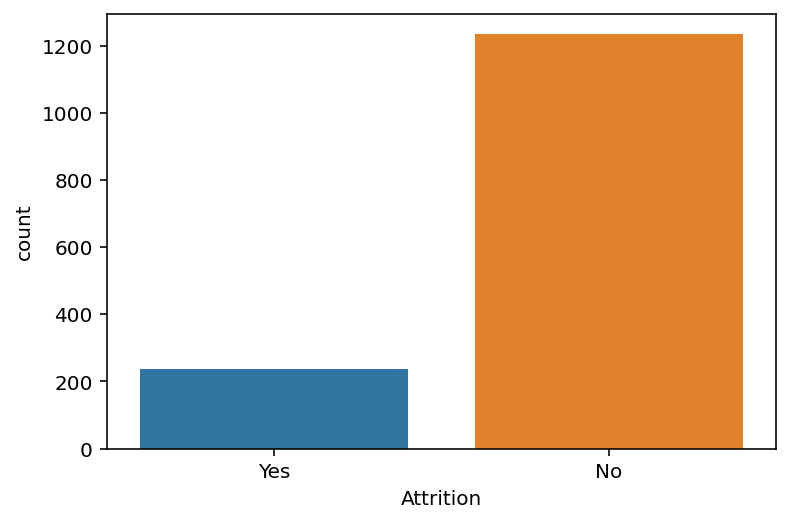

In [9]:
# 타겟의 갯수 시각화
import matplotlib.pyplot as plt
import seaborn as sns

sns.countplot(df[target]);

## 3) 평가지표의 선택
해당 문제의 목표는 이직할 사람을 예측하여 이를 방지하고자 함이다.  
회사 차원에서 직원의 이직은 손실과 비용이 따르는 위험요인이기 때문이다.

타겟의 분포 확인 결과, Yes인 경우가 No인 경우에 비해 적은 불균형한 분포를 보인다.  
타겟이 불균형한 경우 모델이 정답을 맞추기 위해 단순히 다수의 타겟으로 모든 예측을 하는 경우 accuracy가 높게 나오게 된다.  
따라서 해당 문제의 평가지표로 accuracy는 부적절하므로 다른 평가지표를 사용해야한다.  

accuracy를 제외한 분류모델의 평가지표로 precision, recall, f1score를 고려해볼 수 있다.  
이직을 할 직원을 예측하여 이직을 방지하는 것이 목적이므로 Yes(이직)인 경우를 1로 예측하는 분류 모델이 되도록 한다.  
트레이닝셋으로 모델을 학습시켰을 때, 해당 모델에서 발생할 수 있는 오류는 두 가지가 있다.  

1.   모델은 이직을 예측했지만(1), 실제로는 이직을 하지 않은 경우(0)
2.   모델은 이직을 하지 않을 것으로 예측했지만(0), 실제로는 이직을 한 경우(1)

두 가지의 오류 중 향후 인사팀에게 치명적일 수 있는 것은 두 번째의 경우이다.  
모델이 이직을 하지 않을 것이라 예측하여 해당 직원의 이직을 방지할 수 있는 조치를 취하지 못하는 상황이 발생할수 있기 때문이다.  
이는 False Negative인 경우로, 해당 문제에서는 이 오류를 줄이는데 중점을 두어야 한다.  
따라서 모델의 평가지표로 Recall을 채택하여 최적의 임계값에서의 모델의 성능(모델이 이직을 예측했을 때 얼마나 잘 맞추는지)을 확인하고자 한다.

## 4) EDA 및 Feature Engineering

In [10]:
# 타겟을 1(이직)과 0(재직)으로 바꾸어줌
df.Attrition.replace({'Yes': 1, 'No': 0}, inplace=True)

In [11]:
# 앞서 프로파일 warnings에서 확인하였던 하나의 값을 가지는 열 및 고유값만 가지는 열 삭제
df.drop(columns=['EmployeeCount','Over18','StandardHours','EmployeeNumber'], axis=1, inplace=True)

In [12]:
# profile에서 상관관계가 높았던 특성들의 관계 확인
# JobLevel과 MonthlyIncome의 관계

import plotly.express as px
fig = px.scatter(df, x="JobLevel", y="MonthlyIncome", 
                 size='MonthlyIncome')
fig.show()

# 직위는 1에서부터 5까지 나뉘어져있으며, 직위가 높을 수록 임금의 분포가 높게 형성되어 있음을 확인할 수 있다.
# 직위 1에서부터 4까지는 같은 직위일지라도 직위 5보다는 임금의 분포가 다양함을 확인할 수 있다.

In [13]:
fig = px.scatter(df, x=range(1,(len(df)+1)), y="MonthlyIncome", color="JobLevel")
fig.show()
# 단계별로 뚜렷한 임금의 변화를 확인할 수 있다.
# 해당 회사의 월 임금은, 직위에 따라서 결정됨을 유추해볼 수 있다.

In [14]:
df['JobRole'].unique()

array(['Sales Executive', 'Research Scientist', 'Laboratory Technician',
       'Manufacturing Director', 'Healthcare Representative', 'Manager',
       'Sales Representative', 'Research Director', 'Human Resources'],
      dtype=object)

In [15]:
fig = px.scatter(df, x="Department", y="JobRole")
fig.show()

# 현 회사의 부서는 Sales, R&D, HR의 세 부서로 이루어져있다.
# 세 부서는 모두 Manager가 존재하며, 다른 부서에 비해 R&D 부서의 역할이 세세하게 나누어져 있다.
# Sales 부서 직원들의 세부 역할은 Sales Executive, Manager, SalesRepresentative로 구성
# R&D 부서 직원들의 세부 역할은 Research Scientist, Laboratory Technician, Manufacturing Director,Healthcare Representative, Manager, Research Director으로 구성
# Human Resources 부서 직원들의 세부 역할은 Manager, Human Resources 로 구성

In [16]:
fig = px.scatter(df, x="JobRole", y="JobLevel")
fig.show()

# 직무역할 별로 직위가 어떻게 나뉘어 졌는지 확인해보았다.
# 높은 직위로 구성되어 있는 직무역할이 부서내에서 중요한 역할임을 유추해볼 수 있다.

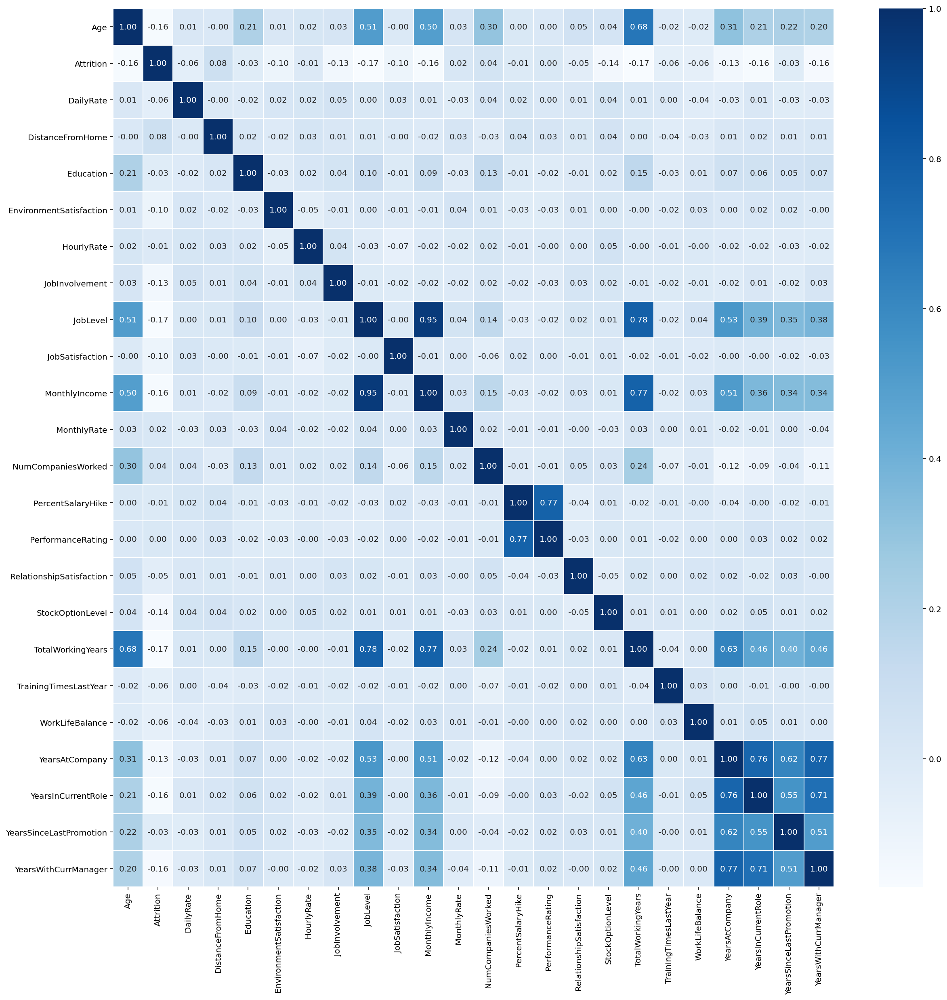

In [17]:
# 수치형 변수와 타겟과의 상관관계 시각화

corr = df.corr()
plt.figure(figsize=(20,20))
sns.heatmap(data = corr, annot=True, 
fmt = '.2f', linewidths=.5, cmap='Blues')

In [18]:
# 수치형 변수와 타겟변수와의 상관관계를 높은 순서대로 나열하여 확인
corr['Attrition'].drop(['Attrition']).sort_values(ascending=False)

DistanceFromHome            0.077924
NumCompaniesWorked          0.043494
MonthlyRate                 0.015170
PerformanceRating           0.002889
HourlyRate                 -0.006846
PercentSalaryHike          -0.013478
Education                  -0.031373
YearsSinceLastPromotion    -0.033019
RelationshipSatisfaction   -0.045872
DailyRate                  -0.056652
TrainingTimesLastYear      -0.059478
WorkLifeBalance            -0.063939
EnvironmentSatisfaction    -0.103369
JobSatisfaction            -0.103481
JobInvolvement             -0.130016
YearsAtCompany             -0.134392
StockOptionLevel           -0.137145
YearsWithCurrManager       -0.156199
Age                        -0.159205
MonthlyIncome              -0.159840
YearsInCurrentRole         -0.160545
JobLevel                   -0.169105
TotalWorkingYears          -0.171063
Name: Attrition, dtype: float64

In [19]:
# 상관관계 시각화에서 높은 상관관계를 보이는(0.5이상) 특성들에 대한 관계 확인

# 나이
# 직무단계
# 월임금
# 임금상승률
# 직무 수행 평가 등급
# 총 근무경력(년)
# 현재 회사의 근속년수
# 현재 역할의 직임기간(년)
# 승진 후 기간(년)
# 현재 책임자와의 근무기간(년)

In [20]:
# 연봉상승률은 근무성적평가등급과 높은 상관관계가 있다. 
# 근무성적평가등급은 3과 4로 나뉘어지는데, 3을 받은 경우의 연봉상승률은 20%미만이나, 4를 받은 경우의 연봉상승률은 20% 이상임을 확인할 수 있다.
# 근무에서 4(좋은 평가)를 받은 사람들을 대상으로 연봉을 더 올려주는 것으로 예상해볼 수 있다.

fig = px.scatter(df, x="PerformanceRating", y="PercentSalaryHike", 
                 size='PercentSalaryHike')
fig.show()


In [21]:
# ratio plot 시각화 위한 함수

def ratio_plot_by_group(data , value , group = None,  fig_kws={"stacked" : True, "title" : ""}) :
    if group is None :
        result = data[value].value_counts(normalize=True)
        multi_index = pd.MultiIndex.from_product([[value], result.index.unique().tolist()], 
                                         names=["group", value])
        result.index = multi_index
        result = result.unstack()
    else :
        result = data.groupby(group)[value].value_counts(normalize=True).unstack()
    result.plot(kind="bar", 
                stacked= fig_kws.get("stacked" , True), 
                title=fig_kws.get("title",""))
    plt.show()
    return None

In [22]:
# 데이터에 대한 가설
# 초과근무를 하는 직원들의 이직율이 높을 것이다.

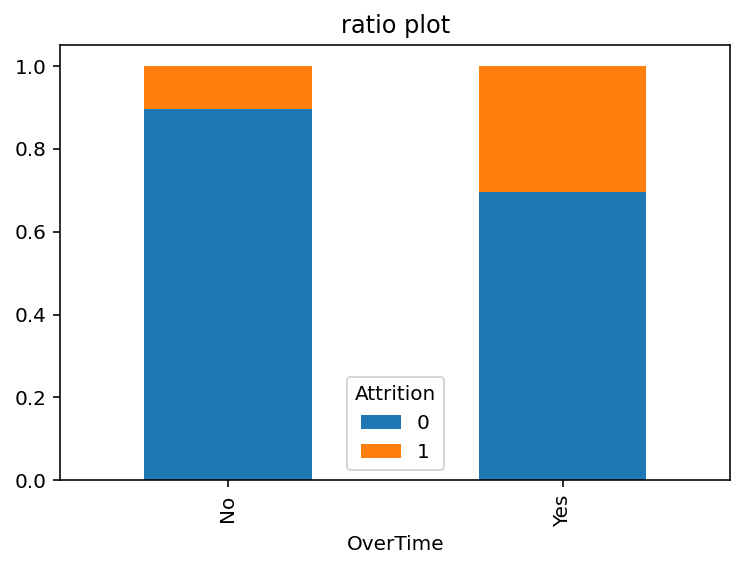

In [23]:
# 초과근무를 하는 사람일 수록 이직율이 높았다.
# 업무 강도가 높아 이직을 많이 결심한 것으로 예상된다.
ratio_plot_by_group(df ,"Attrition", group="OverTime",fig_kws = {"stacked":True,"title" : "ratio plot"});

In [24]:
# 데이터에 대한 가설
# 나이가 많은 직원들 보다는 나이가 어린 직원들의 이직율이 높을 것으로 예상된다.
# 나이가 많은 직원들은 안정성을 선호할 것이고, 나이가 어린 직원은 보다 도전적으로 자신에게 맞는 회사를 찾아갈 것이다.

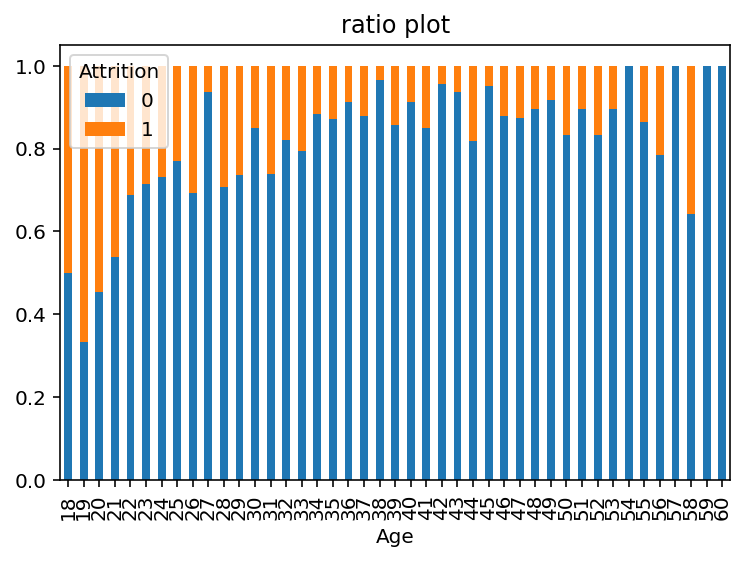

In [25]:
# 나이와 이직율 확인결과 18~30세까지의 연령대에서 이직율이 두드러지게 높고, 그 외에는 연령마다 이직율이 다양하게 나타난다.
# 가설과는 달리 50대 후반의 연령대에서 이직율이 높아짐을 확인할 수 있다. 이는 타회사로의 이직이 아닌 조기 은퇴로 인한 직원 이탈지 추측해본다.

ratio_plot_by_group(df ,"Attrition", group="Age",fig_kws = {"stacked":True,"title" : "ratio plot"});

In [26]:
# 데이터에 대한 가설
# 결혼유무도 이직율에 영향이 있을 것이라 예상된다.

# 결혼을 한 직원들의 경우, 부양할 가족들이 있으므로 비혼인 직원들보다는 신중하게 이직을 결심할 것이다.

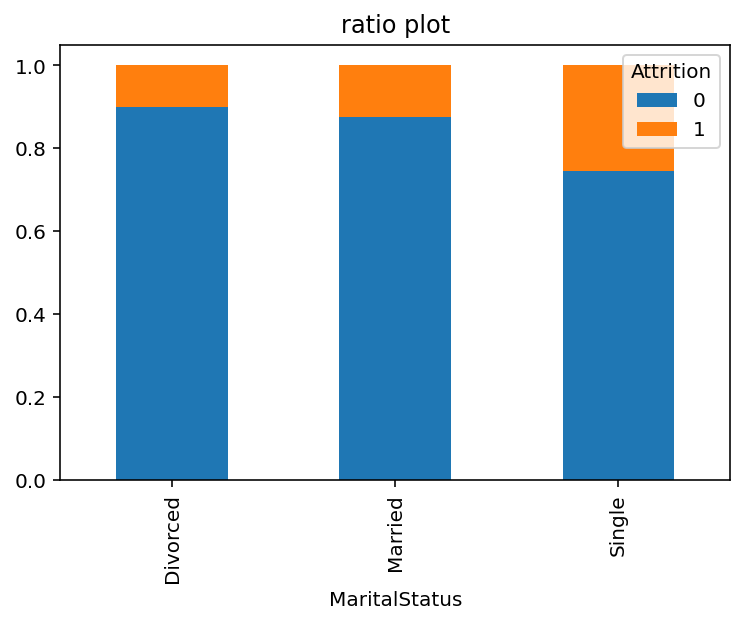

In [27]:
# 결혼유무와 이직율 확인결과 예상대로 비혼인 경우가 기혼인 경우보다는 이직율이 높음을 확인할 수 있다.
ratio_plot_by_group(df ,"Attrition", group="MaritalStatus",fig_kws = {"stacked":True,"title" : "ratio plot"});

In [28]:
# 데이터에 대한 가설
# 최종학력이 높을 수록 이직율이 높을 것이라 예상된다.

# 최종학력이 높은 직원의 업무성과가 좋다면, 다른 회사에서 좋은 조건으로 잡오퍼를 받아 이직을 하는 경우가 있을 것이다.

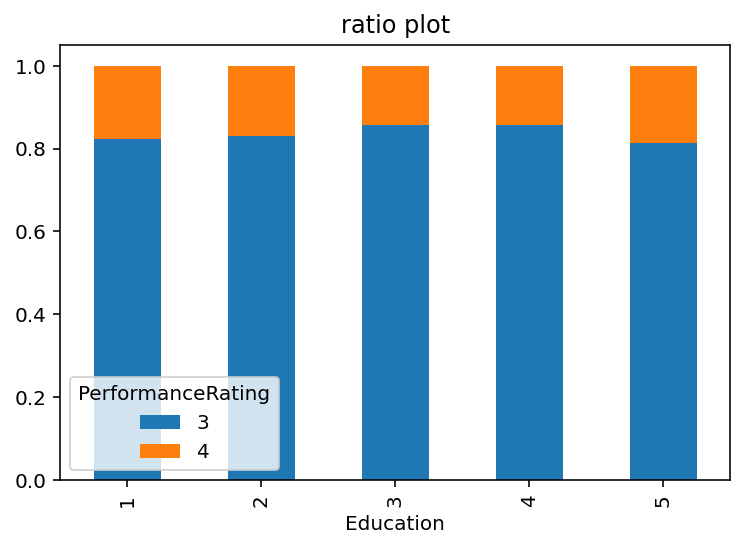

In [29]:
# 최종학력과 업무성과 확인 결과 
# 최종학력이 가장 높은 경우, 업무성과가 4인 비율이 가장 컸지만 그 외에는 큰 차이가 보이지 않는다.
ratio_plot_by_group(df ,"PerformanceRating", group="Education",fig_kws = {"stacked":True,"title" : "ratio plot"});

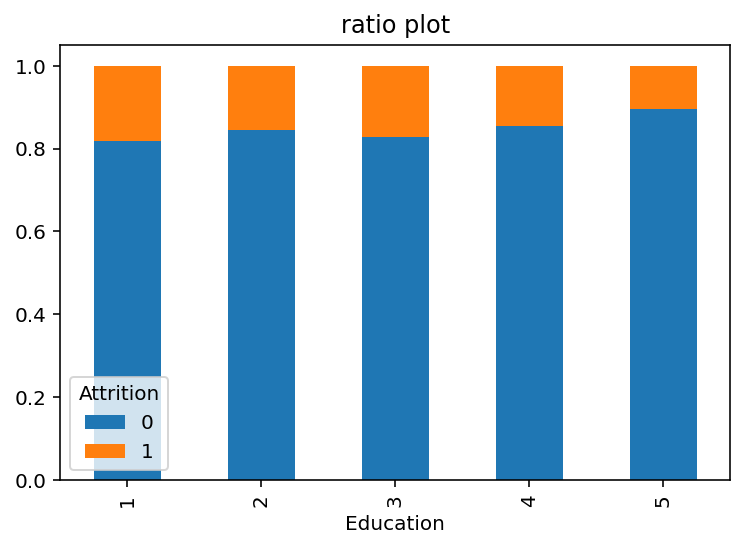

In [30]:
# 최종학력과 이직율 확인
# 가설과는 달리 최종학력이 가장 높은 5에서 가장 낮은 이직율을 보이고 있다. 
# 최종학력이 높은 직원들이 좋은 성과를 내고, 그 성과에 대한 적절한 보상을 받고 재직중인 것으로 예상된다. 
ratio_plot_by_group(df ,"Attrition", group="Education",fig_kws = {"stacked":True,"title" : "ratio plot"});

In [31]:
# 데이터에 대한 가설
# 통근거리가 길 수록 이직율이 높을 것이라 예상된다.

# 통근거리는 업무와 관련이 없지만 직원의 삶의 질에 큰 영향을 미치는 요인이다. 통근거리가 먼 직원들은 이직을 고려할 가능성이 크다.

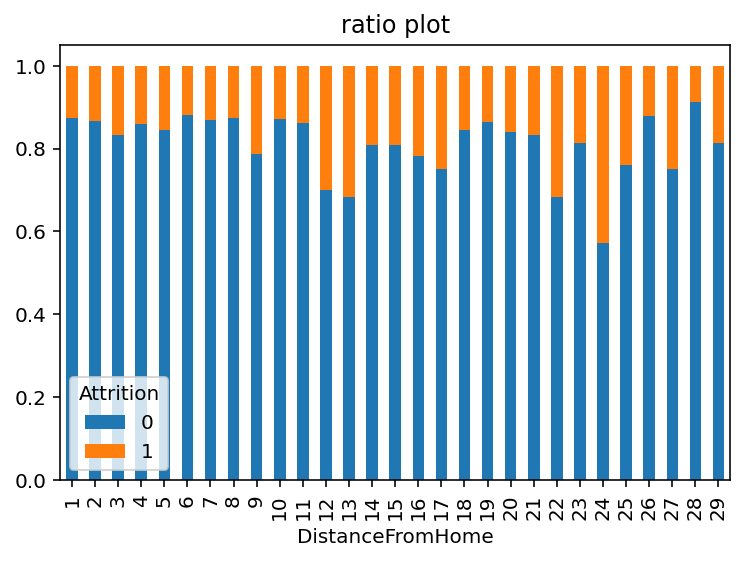

In [32]:
# 통근거리와 이직율 확인결과 개인 편차가 있지만 대체적으로 보았을때 통근거리가 멀어질 수록 이직율이 증가한다.
ratio_plot_by_group(df ,"Attrition", group="DistanceFromHome",fig_kws = {"stacked":True,"title" : "ratio plot"});

In [33]:
# 데이터에 대한 가설
# 근무부서에 따라서 만족도, 보상이 다를 수 있기 때문에 이직율도 상이할 수 있다고 예상된다.

# 근무부서에 따른 만족도의 평균이 같은지 다른지 확인해본다.
# 근무부서에 따른 보상의 평균이 같은지 다른지 확인해본다.

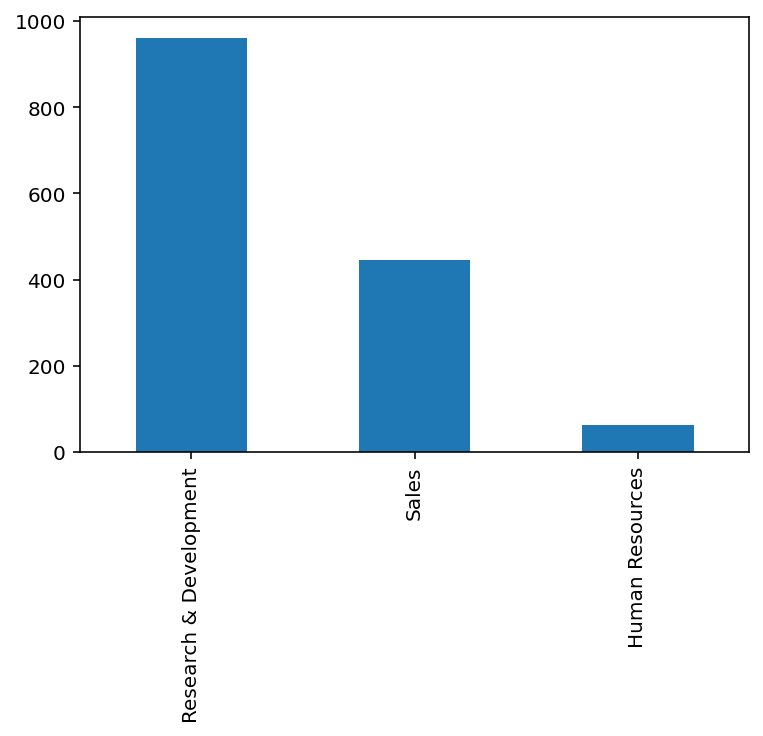

In [34]:
# 해당 회사에는 연구개발 부서에 소속되어 있는 직원이 가장 많다.
df['Department'].value_counts(dropna = False).plot.bar()
plt.show()

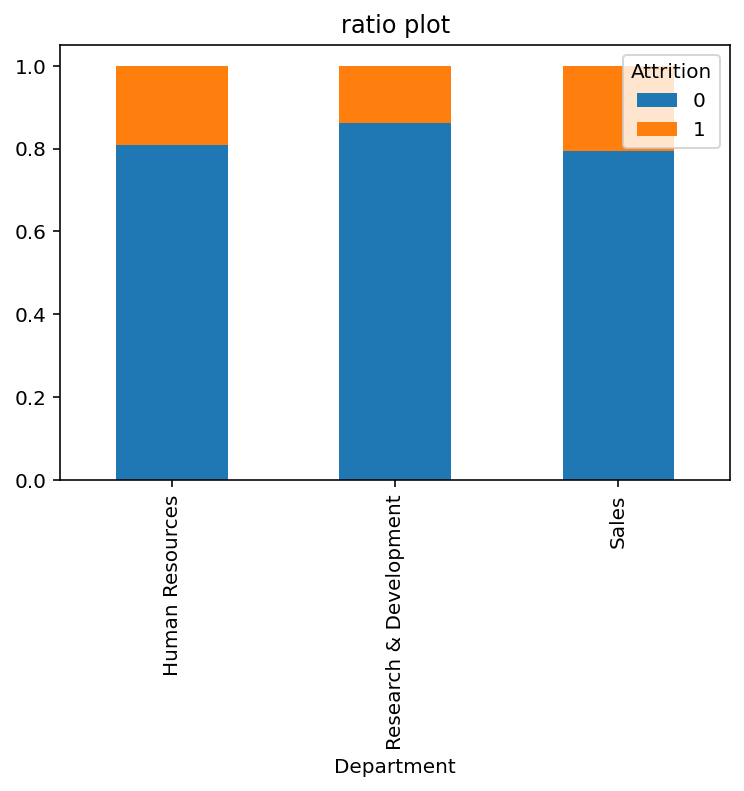

In [35]:
# 부서별 이직율은 상이하게 확인된다. R&D부서의 직원의 이직율이 타 부서보다는 적다.
ratio_plot_by_group(df ,"Attrition", group="Department",fig_kws = {"stacked":True,"title" : "ratio plot"});

In [36]:
# 부서에 따른 만족도의 평균 확인 결과, 부서별로 차이가 미미한 수준이다.

In [37]:
df.groupby('Department').WorkLifeBalance.mean()

Department
Human Resources           2.920635
Research & Development    2.725286
Sales                     2.816143
Name: WorkLifeBalance, dtype: float64

In [38]:
df.groupby('Department').JobSatisfaction.mean()

Department
Human Resources           2.603175
Research & Development    2.726327
Sales                     2.751121
Name: JobSatisfaction, dtype: float64

In [39]:
df.groupby('Department').EnvironmentSatisfaction.mean()

Department
Human Resources           2.682540
Research & Development    2.744017
Sales                     2.679372
Name: EnvironmentSatisfaction, dtype: float64

In [40]:
df.groupby('Department').RelationshipSatisfaction.mean()

Department
Human Resources           2.888889
Research & Development    2.708637
Sales                     2.695067
Name: RelationshipSatisfaction, dtype: float64

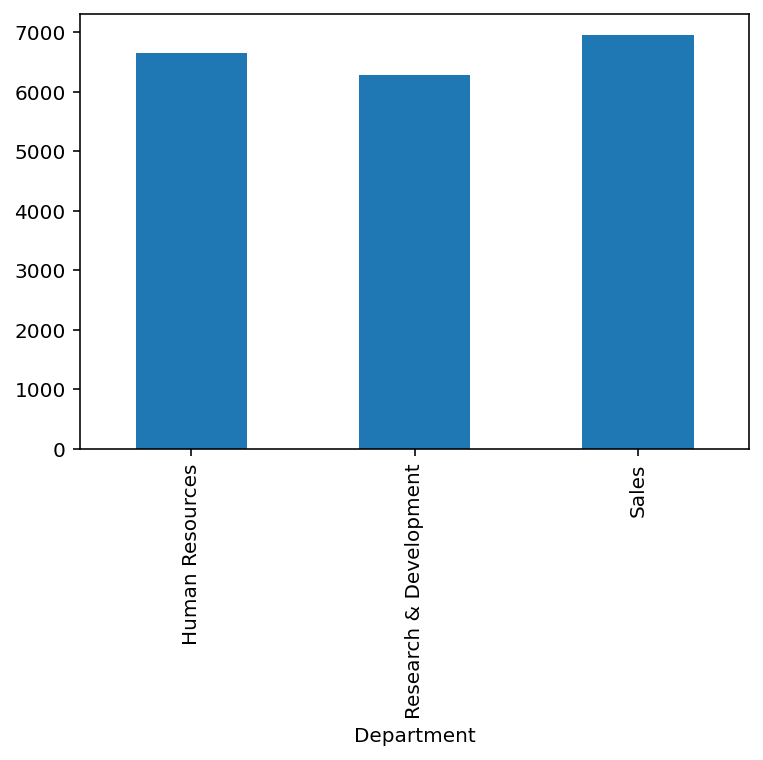

In [41]:
# 부서별 임금 확인 결과, R&D 부서의 이직율이 타 부서에 비해 낮음에도 불구하고 임금평균이 가장 낮았다.
df.groupby('Department').MonthlyIncome.mean().plot(kind='bar')

In [42]:
# 데이터에 대한 가설
# 출장빈도가 잦을 수록 이직율이 높을 것이다.

# 개개인에 성향에 따라 출장의 선호도가 다르겠지만, 일반적으로 출장이 잦은 경우 육체적으로 많은 에너지를 소모하므로 직무에 대한 만족도가 떨어질 것이다.
# 출장빈도에 따른 이직율 확인, 출장빈도에 따른 직무 만족도 확인, 출장빈도에 따른 근무환경 만족도 확인

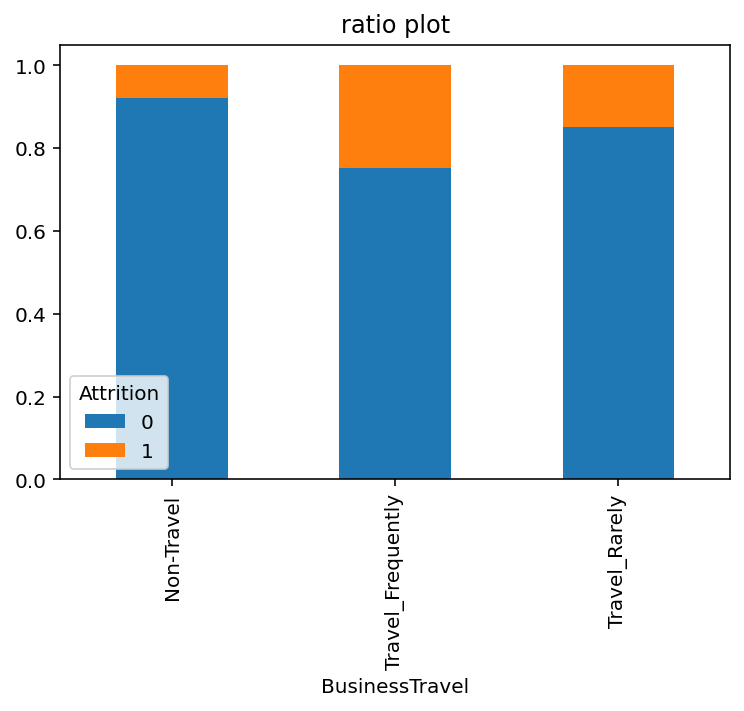

In [43]:
# 출장이 없거나 드물게 다니는 직원보다는 출장을 종종 가는 직원의 이직율이 높았다.
ratio_plot_by_group(df ,"Attrition", group="BusinessTravel",fig_kws = {"stacked":True,"title" : "ratio plot"});

In [44]:
# 출장빈도에 따른 직무만족도 및 근무환경만족도 확인 결과 이직율 발생과는 다른 양상을 보였다.

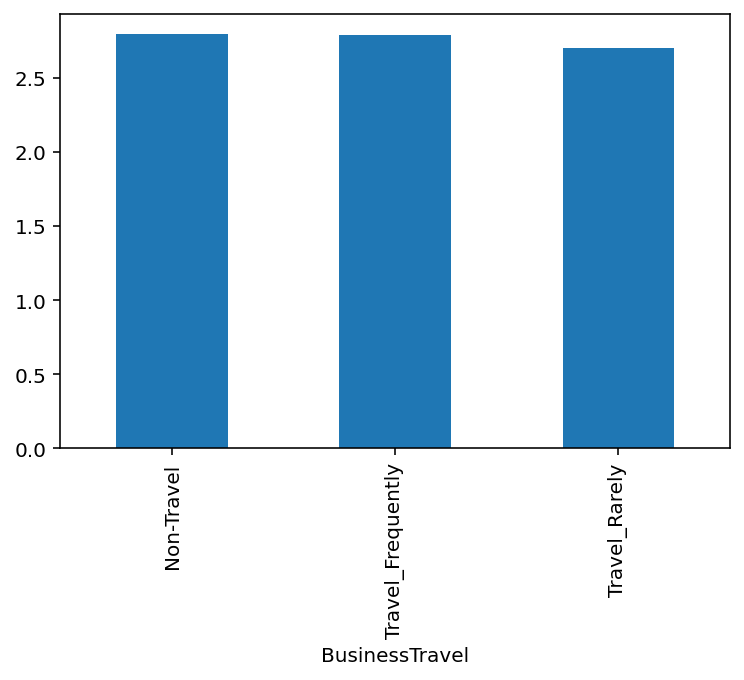

In [45]:
df.groupby('BusinessTravel').JobSatisfaction.mean().plot(kind='bar')

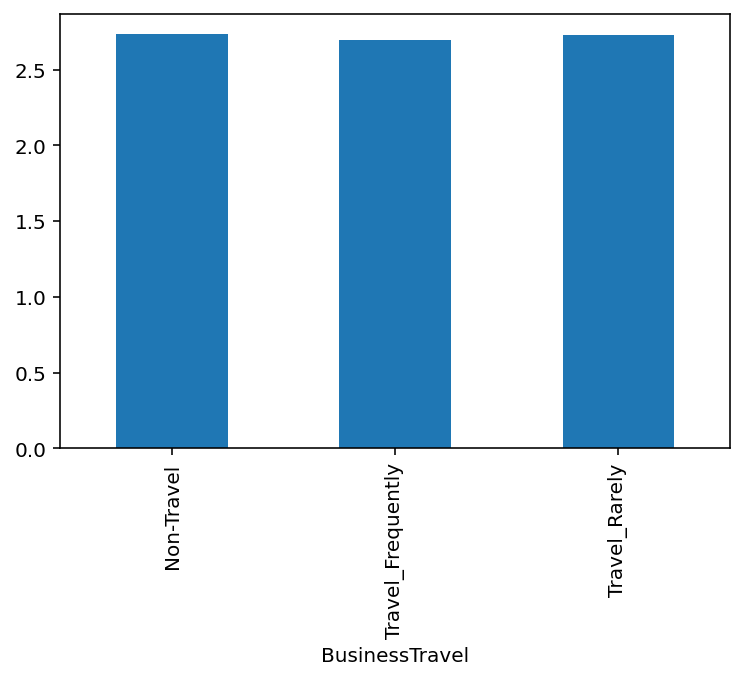

In [46]:
df.groupby('BusinessTravel').EnvironmentSatisfaction.mean().plot(kind='bar')

In [47]:
# 데이터에 대한 가설
# 직무 단계가 높을 수록 이직율은 낮을 것이다.

# 이미 회사에서 높은 직위에 있는 직원일 것이므로, 보상의 차원에서 회사의 대우가 좋을 것이며 이에 따라 이직율이 낮을 것으로 예상된다.

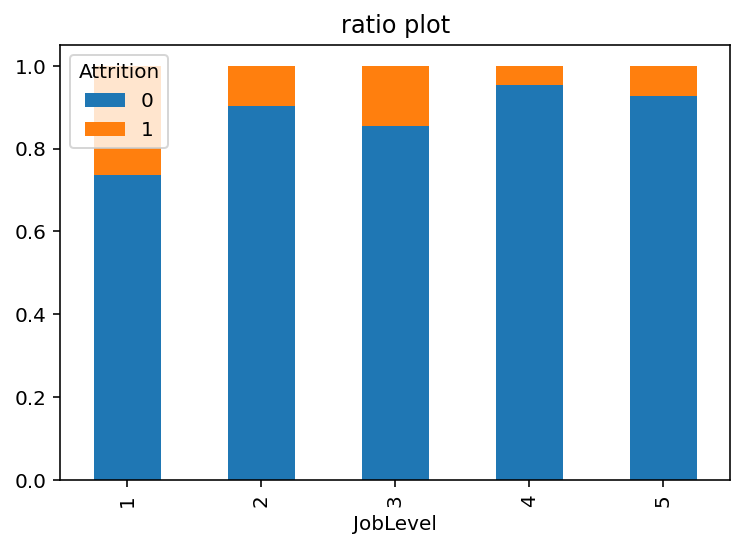

In [48]:
# 직무단계와 이직율 확인
# 직무단계가 낮은 경우에는 이직율이 확연하게 높았으며, 4 이상인 경우에는 이직율이 낮음을 확인할 수 있다.
ratio_plot_by_group(df ,"Attrition", group="JobLevel",fig_kws = {"stacked":True,"title" : "ratio plot"});

In [49]:
# 데이터에 대한 가설

# 만족도와 관련된 항목들은 이직율과 높은 상관관계가 있을 것으로 판단된다.
# 만족도 관련 항목 = 'EnvironmentSatisfaction' 근무환경 만족도 /'JobSatisfaction' 직무 만족도/'RelationshipSatisfaction' 사내 관계 만족도/'WorkLifeBalance' 워라밸  
# 각각의 만족도에 따른 이직율 확인

In [50]:
# 각각의 만족도에 따른 이직율 확인 결과, 만족도가 가장 낮을때의 이직율이 가장 높았으나 만족도가 2 이상인 경우에서는 확연한 차이를 확인하기는 힘들었다.
# 특히나 워라밸이 낮을때 이직율이 두드러지게 높아짐을 확인할 수 있다.

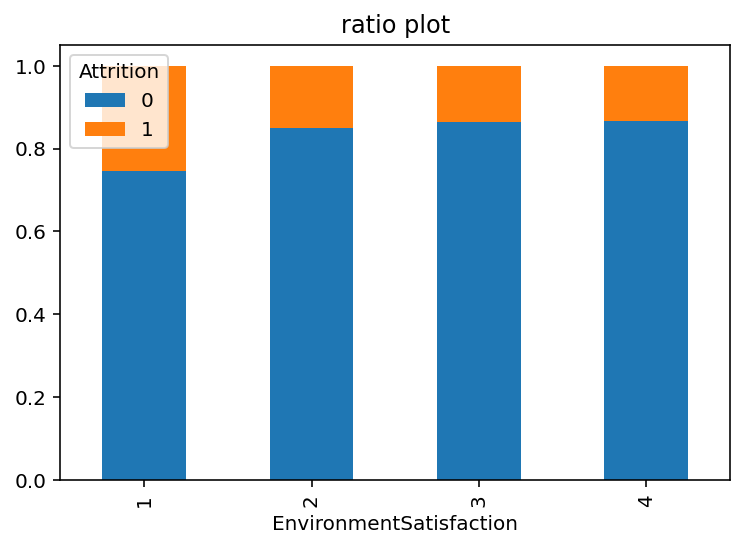

In [51]:
ratio_plot_by_group(df ,"Attrition", group="EnvironmentSatisfaction",fig_kws = {"stacked":True,"title" : "ratio plot"});

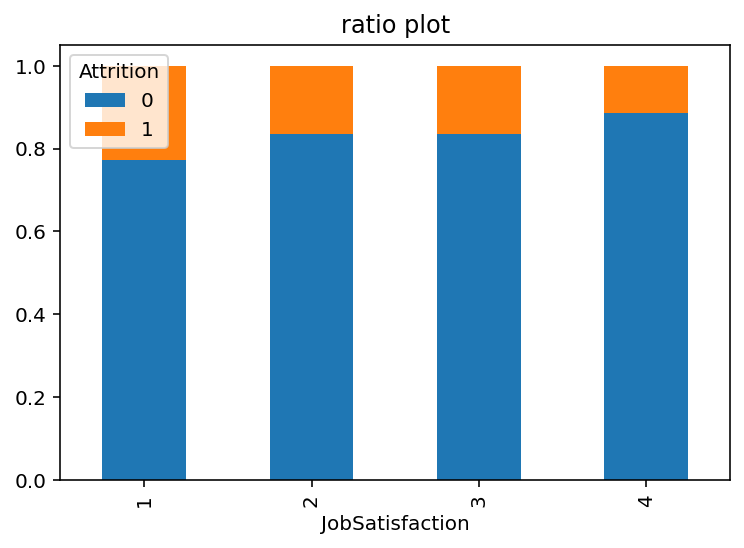

In [52]:
ratio_plot_by_group(df ,"Attrition", group="JobSatisfaction",fig_kws = {"stacked":True,"title" : "ratio plot"});

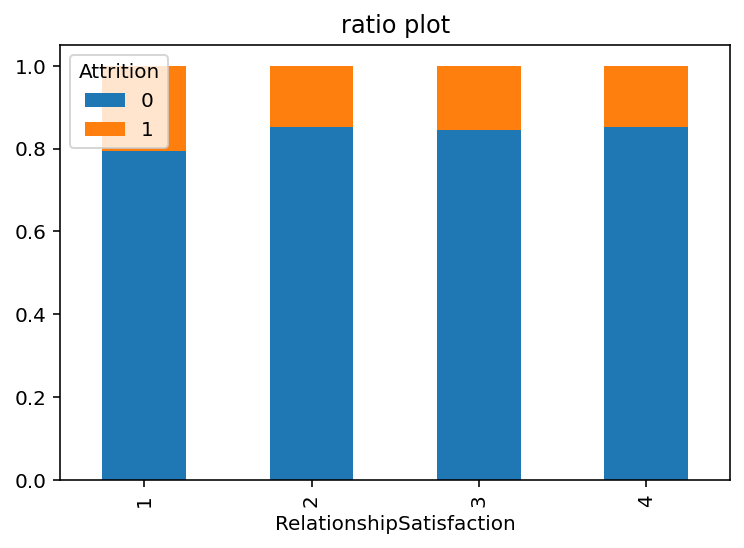

In [53]:
ratio_plot_by_group(df ,"Attrition", group="RelationshipSatisfaction",fig_kws = {"stacked":True,"title" : "ratio plot"});

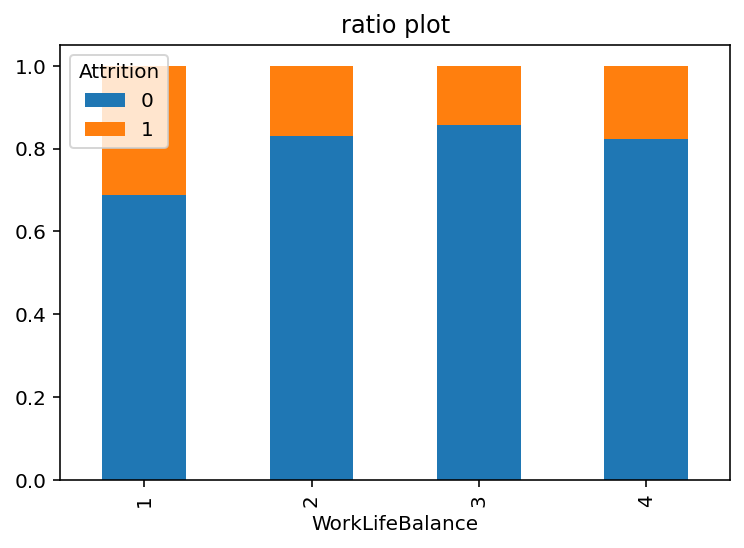

In [54]:
ratio_plot_by_group(df ,"Attrition", group="WorkLifeBalance",fig_kws = {"stacked":True,"title" : "ratio plot"});

In [55]:
# 데이터에 대한 가설

# 마지막 승진 후 기간이 길수록 이직율이 높을 것이다.
# 승진제도는 회사에 대한 직원의 만족도와 직원의 임금과 연관이 있을 것이다. 승진하는데에 오랜 시간이 걸리는 직원들은 더 좋은 조건의 회사를 찾아서 이직을 생각해볼 가능성이 있다.
# 마지막 승진 후 기간에 따른 직무 만족도 확인, 마지막 승진 후 기간에 따른 이직율 확인

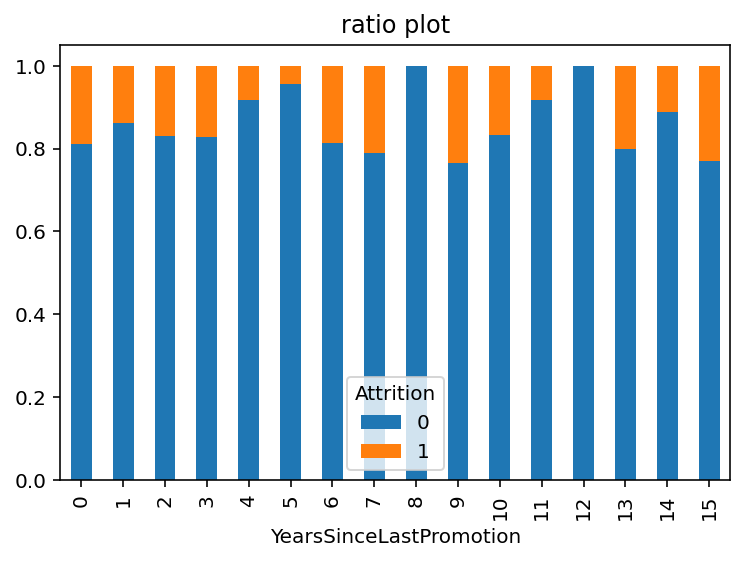

In [56]:
# 가설과는 다르게 기간에 비례하여 이직율이 증가하지 않는다. 이직율과는 큰 연관이 없는 것으로 보인다.
ratio_plot_by_group(df ,"Attrition", group="YearsSinceLastPromotion",fig_kws = {"stacked":True,"title" : "ratio plot"});

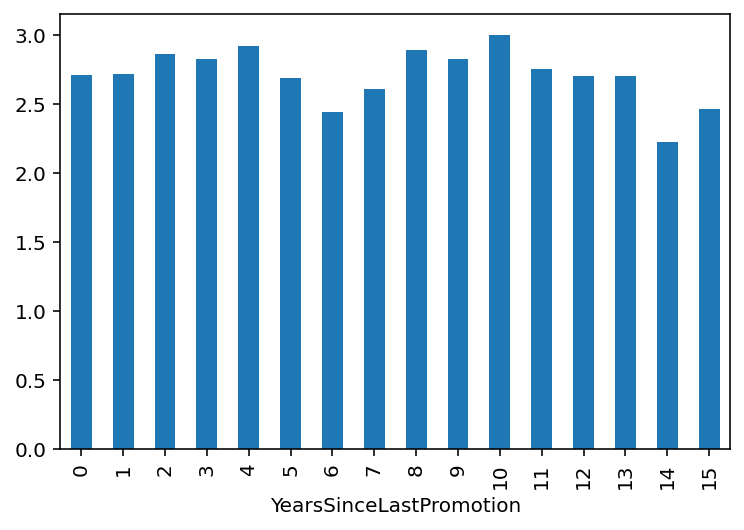

In [57]:
# 마지막 승진 후 기간에 따른 직무 만족도 확인결과 그 기간이 14,15년인 경우에 만족도는 눈에 띄게 낮아지지만, 이외의 경우에서는 별다른 연관성을 찾아보기 힘들다.
df.groupby('YearsSinceLastPromotion').JobSatisfaction.mean().plot(kind='bar')

In [58]:
# 데이터에 대한 가설
# 총 근무경력/ 재직했던 회사의 수 = 평균 재직년수 
# 평균 재직년수가 낮은 직원일 수록 이직을 할 가능성이 클 것이다.

# 평균 재직년수에 대한 새로운 피쳐 생성하여 해당 피쳐와 이직율의 관계 확인

In [59]:
# 한 직장에서 평균적으로 몇년 일하는 지에 대한 특성을 만듦
df['AverageWorkingYears'] = df['TotalWorkingYears'] / df['NumCompaniesWorked']

In [60]:
# inf는 현재 회사가 첫 직장인 사람에서 발생하는 값으로 0으로 대체함
import numpy as np
from numpy import inf

df['AverageWorkingYears'].replace(np.inf, 0, inplace=True)

In [61]:
# inf값 있는지 확인
np.isinf(df['AverageWorkingYears']).any()

False

In [62]:
# 정수타입으로 변경
df['AverageWorkingYears'] = df['AverageWorkingYears'].astype(int)

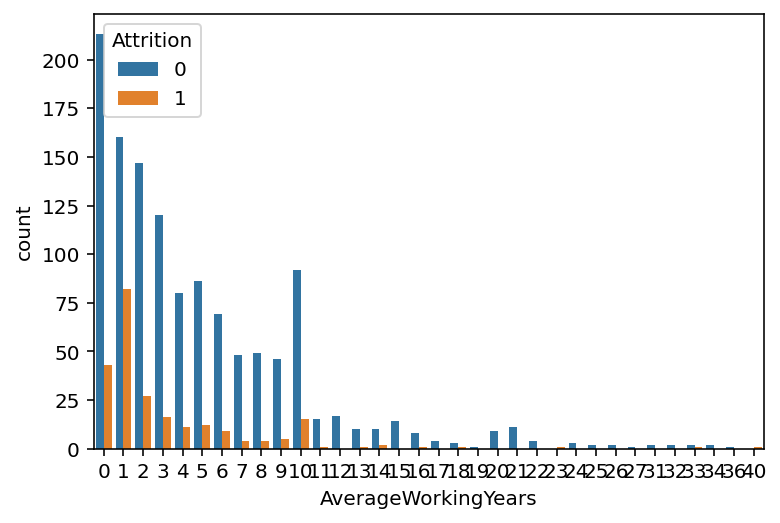

In [63]:
# 평균재직년수가 10년 이하일 때, 이직하는 직원들이 많다.  
sns.countplot(data = df, x= "AverageWorkingYears",  hue = "Attrition")

In [64]:
# 데이터에 대한 가설
# 현재 회사의 근속년수/ 총 근무경력 = 전체 경력 중 현재 회사에서의 경력 = 회사에 대한 충성도
# 회사에 대한 충성도가 높은 직원일 수록 이직을 할 가능성이 낮을 것이다.

# 회사에 대한 충성도로 새로운 피쳐 생성하여 이직율과의 관계 확인 

In [65]:
# 현재 회사에 대한 충성도 (현재까지 근무경력중 현재 회사에서의 근속년수 대한 비율)특성을 만듦
# 충성도가 높을 수록 이탈율이 낮을 것으로 예상해봄
df['YearsAtCompany_Of_Total'] = df['YearsAtCompany'] / df['TotalWorkingYears'] *100

In [66]:
# nan은 현재 회사가 첫 직장인 사람에서 발생하는 값으로 0으로 대체함

df['YearsAtCompany_Of_Total'].replace(np.nan, 0, inplace=True)

In [67]:
np.isnan(df['YearsAtCompany_Of_Total']).any()

False

In [68]:
# % 단위로 바꾸어줌
df['YearsAtCompany_Of_Total'] = df['YearsAtCompany_Of_Total'].astype(int) * 0.01

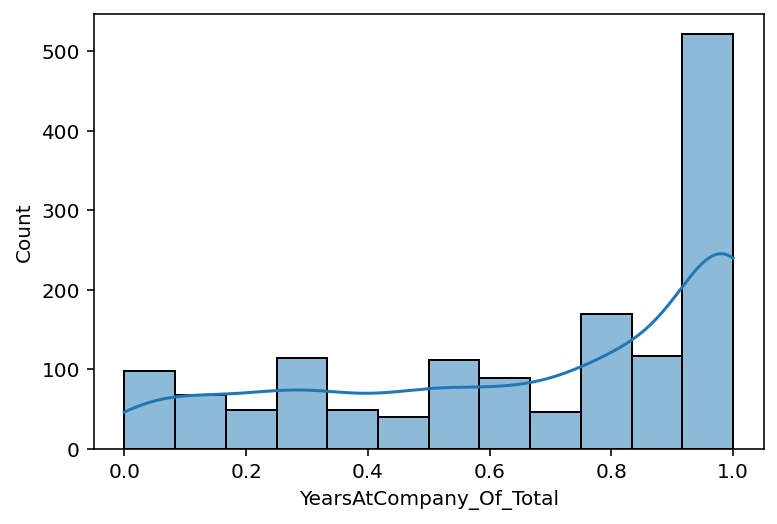

In [69]:
sns.histplot(df['YearsAtCompany_Of_Total'],kde=True);

In [70]:
df['YearsAtCompany_Of_Total'].value_counts()

1.00    463
0.50     59
0.83     55
0.00     44
0.80     42
       ... 
0.54      1
0.89      1
0.43      1
0.02      1
0.79      1
Name: YearsAtCompany_Of_Total, Length: 89, dtype: int64

In [71]:
# 충성도 100%인 직원들의 이탈율과 충성도 20% 이하인 직원들의 이탈율 비교

In [72]:
onehundred_loyalty = df[df['YearsAtCompany_Of_Total']==1]

In [73]:
onehundred_loyalty['Attrition'].value_counts(normalize=True)

0    0.818575
1    0.181425
Name: Attrition, dtype: float64

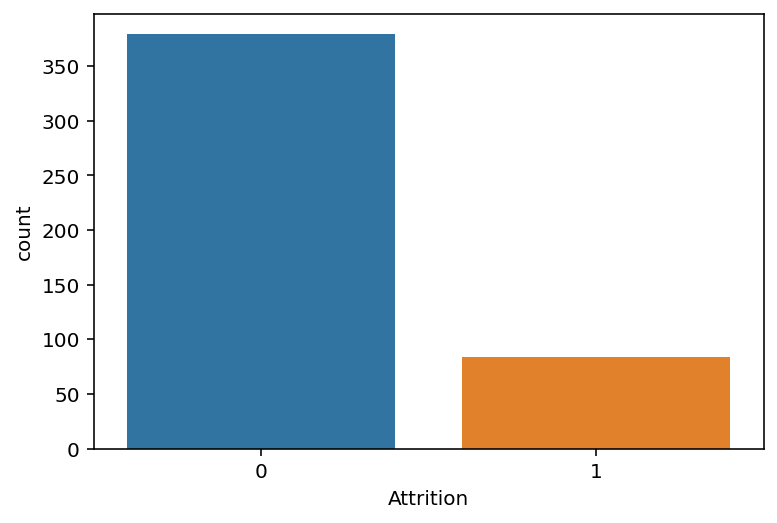

In [74]:
sns.countplot(data = onehundred_loyalty, x='Attrition')

In [75]:
twenty_loyalty = df[df['YearsAtCompany_Of_Total']<=0.2]

In [76]:
twenty_loyalty['Attrition'].value_counts(normalize=True)

0    0.808081
1    0.191919
Name: Attrition, dtype: float64

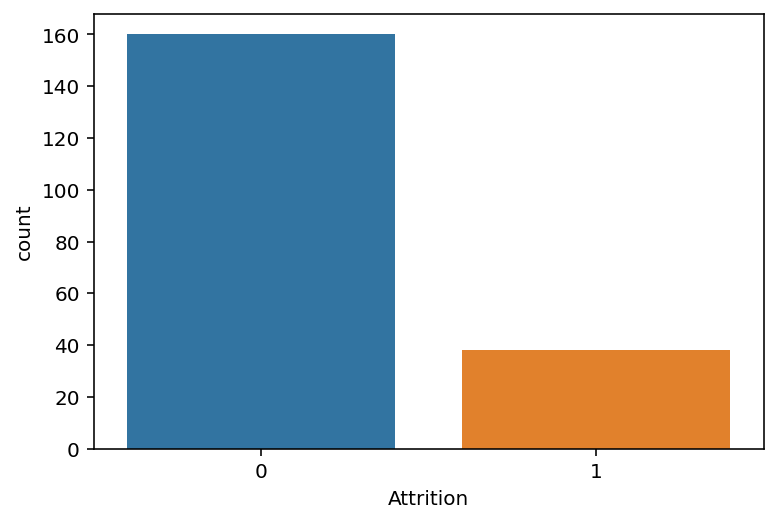

In [77]:
sns.countplot(data = twenty_loyalty, x='Attrition')

In [78]:
# 새로 생성한 피쳐인 회사에 대한 충성도에 따른 이직여부 확인해보았으나, 충성도가 100%일때, 20%미만일때를 비교해 본 결과 이직율에 큰 차이가 없었다.

In [79]:
# 데이터에 대한 가설
# 임금상승률이 높았던 직원은 이직을 할 가능성이 낮을 것이다.

# 최근에 임금이 올랐으므로, 당분간은 재직을 하는 직원들이 많을 것이다.
# 임금상승률에 따른 이직율 확인 

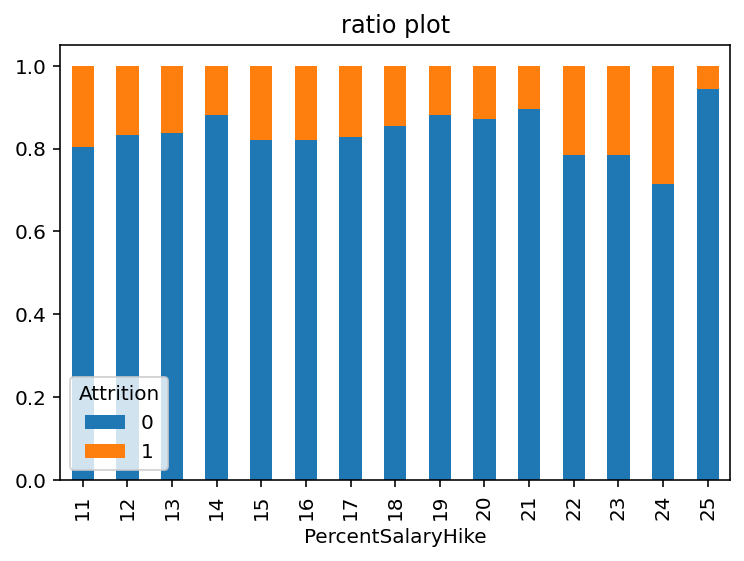

In [80]:
# 임금상승률이 가장 높았던 직원의 경우는 이직율이 가장 낮았지만, 임금상승률에 비례하여 이직율이 감소하지는 않았다.

ratio_plot_by_group(df ,"Attrition", group="PercentSalaryHike",fig_kws = {"stacked":True,"title" : "ratio plot"});

In [81]:
# 데이터에 대한 가설
# 스톡옵션 레벨이 높을 수록 이직을 할 가능성이 낮을 것이다.

# 스톡옵션은 임금 외에 직원에게 부여되는 보상이기 때문에, 높은 스톡옵션 레벨을 가지고 있다면 이를 행사하기 전까지 이직을 할 가능성이 낮을 것이다.
# 스톡옵션 레벨에 따른 이직율 확인

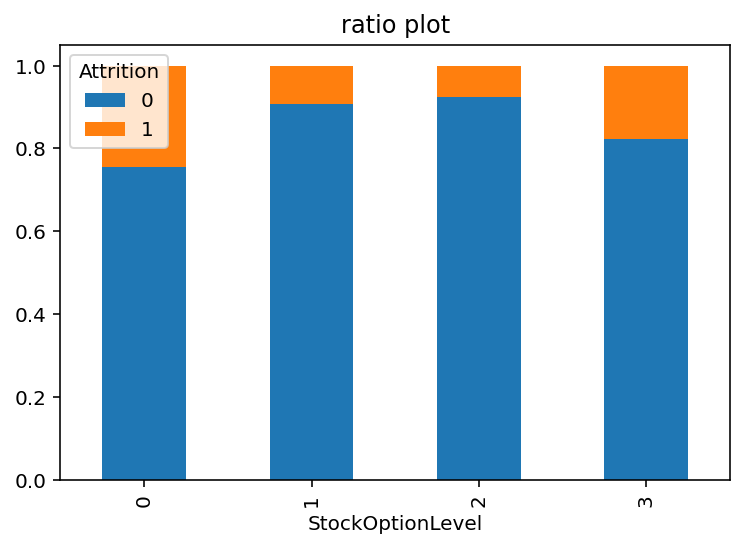

In [82]:
# 스톡옵션이 아예 없는 경우에는 있는 경우보다 이직율이 높은 것으로 확인된다.
# 스톡옵션을 가지고 있는 경우에는 가설과는 달리 level이 3인 경우의 이직율이 가장 높은 것으로 보아 스톡옵션의 레벨은 이직율과 비례하지 않는다.
ratio_plot_by_group(df ,"Attrition", group="StockOptionLevel",fig_kws = {"stacked":True,"title" : "ratio plot"});

In [83]:
# 만족도에 관한 특성을 하나로 묶음
df['OverallSatisfaction'] = df['JobSatisfaction'] + df['RelationshipSatisfaction'] + df['EnvironmentSatisfaction']
df.drop(columns=['JobSatisfaction','RelationshipSatisfaction','EnvironmentSatisfaction'],axis=1,inplace=True)

In [84]:
# Hourly, Daily, Monthly Rate은 결국 Monthly income 에 반영될 것이므로 해당 특성 삭제
df.drop(columns=['HourlyRate', 'DailyRate', 'MonthlyRate'],axis=1,inplace=True)

In [85]:
# 수치데이터인 통근 거리를 카테고리형(가깝다/ 보통/ 멀다)으로 바꾸기 위한 함수
def group1(data):
    if int(data) >=1 & int(data) <= 5:
        return 'NearBy'
    elif int(data) >=6 & int(data) <= 15:
        return 'MidDistance'
    else:
        return 'Far'

# 년도에 대한 수치 데이터 또한 기준을 정하여 카테고리형(짧다 /보통/ 길다)으로 바꾸기 위한 함수
def group2(data):
    if int(data) >=0 & int(data) <= 3:
        return 'short'
    elif int(data) >3 & int(data) <= 8:
        return 'medium'
    else:
        return 'long'

# 근무 기간에 대한 데이터를 5년 이하면 짧음, 5년 이상10년이하면 보통, 그 이상이면 길다 로 바꾸기 위한 함수     
def group3(data):
    if int(data) >=0 & int(data) <= 5:
        return 'short'
    elif int(data) >5 & int(data) <= 10:
        return 'medium'
    else:
        return 'long'

In [86]:
# 해당하는 feature에 적용
df['DistanceFromHome'] = df['DistanceFromHome'].apply(group1)
df['YearsInCurrentRole'] = df['YearsInCurrentRole'].apply(group2)
df['YearsWithCurrManager'] = df['YearsWithCurrManager'].apply(group2)
df['YearsSinceLastPromotion'] = df['YearsSinceLastPromotion'].apply(group2)
df['YearsAtCompany'] = df['YearsAtCompany'].apply(group2)
df['TotalWorkingYears'] = df['TotalWorkingYears'].apply(group3)

In [87]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'Department', 'DistanceFromHome',
       'Education', 'EducationField', 'Gender', 'JobInvolvement', 'JobLevel',
       'JobRole', 'MaritalStatus', 'MonthlyIncome', 'NumCompaniesWorked',
       'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager',
       'AverageWorkingYears', 'YearsAtCompany_Of_Total',
       'OverallSatisfaction'],
      dtype='object')

## 5) Hold-out 검증방식으로 데이터셋 분할

In [88]:
from sklearn.model_selection import train_test_split

X = df.drop('Attrition', axis=1)
y = df['Attrition']
# X는 특성(피쳐)데이터, y는 타겟(라벨)데이터

# 전체 데이터를 훈련세트와 테스트세트로 나눔 (8:2)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2,random_state=1)

# 훈련세트를 훈련데이터와 검증데이터로 나눔 (7.5:2.5) 
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1) 
# 0.25 x 0.8 = 0.2

# 전체 데이터에 대한 훈련/검증/테스트 세트 비율 (6:2:2)
# 최종적으로 각 데이터들의 shape 확인 필요

## 6) 정보누수 확인

정보의 누수를 방지하기 위해서 각각의 특성이 타겟 데이터를 얻는 시점에 사용할 수 있는 데이터인지   확인하였다.  
데이터의 특성들은 타겟 데이터를 얻기 전에 만들어질 수 있는 특성들로, 타겟에 영향을 받은 데이터는 없었다.  
또한 해당 데이터는 시계열 데이터가 아니기 때문에 hold-out 방법으로 훈련데이터와 검증데이터를 완전히 분리하였다.

# 모델 실험

LogisticRegression, Randomforest, XGB, LGBM classifier 사용해보고, 그 중 성능이 좋은 모델을 튜닝할 예정  


### 0) 오버샘플링 이전

In [89]:
from sklearn.linear_model import LogisticRegression
from category_encoders import OrdinalEncoder
from sklearn.pipeline import make_pipeline

pipe = make_pipeline(
    OrdinalEncoder(), 
		LogisticRegression(random_state=2, solver='liblinear')
)

pipe.fit(X_train,y_train)

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



Pipeline(memory=None,
         steps=[('ordinalencoder',
                 OrdinalEncoder(cols=['BusinessTravel', 'Department',
                                      'DistanceFromHome', 'EducationField',
                                      'Gender', 'JobRole', 'MaritalStatus',
                                      'OverTime', 'TotalWorkingYears',
                                      'YearsAtCompany', 'YearsInCurrentRole',
                                      'YearsSinceLastPromotion',
                                      'YearsWithCurrManager'],
                                drop_invariant=False, handle_missing='value',
                                handle_unknown='val...
                                          'data_type': dtype('O'),
                                          'mapping': short    1
NaN     -2
dtype: int64}],
                                return_df=True, verbose=0)),
                ('logisticregression',
                 LogisticRegression(C=1.0, class_weig

In [90]:
from sklearn.metrics import classification_report

y_pred = pipe.predict(X_val)
print(classification_report(y_val, y_pred))

              precision    recall  f1-score   support

           0       0.88      0.99      0.93       250
           1       0.75      0.20      0.32        44

    accuracy                           0.87       294
   macro avg       0.81      0.60      0.62       294
weighted avg       0.86      0.87      0.84       294



In [91]:
from sklearn.ensemble import RandomForestClassifier
from category_encoders import OrdinalEncoder
from sklearn.pipeline import make_pipeline

pipe = make_pipeline(
    OrdinalEncoder(), 
		RandomForestClassifier(random_state=2)
)

# random_state 으로 랜덤성 고정

pipe.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('ordinalencoder',
                 OrdinalEncoder(cols=['BusinessTravel', 'Department',
                                      'DistanceFromHome', 'EducationField',
                                      'Gender', 'JobRole', 'MaritalStatus',
                                      'OverTime', 'TotalWorkingYears',
                                      'YearsAtCompany', 'YearsInCurrentRole',
                                      'YearsSinceLastPromotion',
                                      'YearsWithCurrManager'],
                                drop_invariant=False, handle_missing='value',
                                handle_unknown='val...
                 RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                        class_weight=None, criterion='gini',
                                        max_depth=None, max_features='auto',
                                        max_leaf_nodes=None, max_samples=None,
       

In [92]:
from sklearn.metrics import classification_report

y_pred = pipe.predict(X_val)
print(classification_report(y_val, y_pred))

              precision    recall  f1-score   support

           0       0.87      0.99      0.92       250
           1       0.67      0.14      0.23        44

    accuracy                           0.86       294
   macro avg       0.77      0.56      0.57       294
weighted avg       0.84      0.86      0.82       294



In [93]:
from xgboost import XGBClassifier
from sklearn.preprocessing import StandardScaler

pipe = make_pipeline(
    OrdinalEncoder(),
    StandardScaler(),
    XGBClassifier(random_state=2,
                  n_jobs=-1,
                  n_estimators=300) #기본값 설정시 성능이 현저히 저하되어 조절하여 봄
)

xgb = pipe.fit(X_train, y_train);

In [94]:
from sklearn.metrics import classification_report

y_pred = pipe.predict(X_val)
print(classification_report(y_val, y_pred))

              precision    recall  f1-score   support

           0       0.89      0.95      0.92       250
           1       0.56      0.34      0.42        44

    accuracy                           0.86       294
   macro avg       0.72      0.65      0.67       294
weighted avg       0.84      0.86      0.85       294



In [95]:
# LGBM으로 모델 만들기
from lightgbm import LGBMClassifier

pipe = make_pipeline(
    OrdinalEncoder(), 
		LGBMClassifier(random_state=2)
)

# random_state 으로 랜덤성 고정

pipe.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('ordinalencoder',
                 OrdinalEncoder(cols=['BusinessTravel', 'Department',
                                      'DistanceFromHome', 'EducationField',
                                      'Gender', 'JobRole', 'MaritalStatus',
                                      'OverTime', 'TotalWorkingYears',
                                      'YearsAtCompany', 'YearsInCurrentRole',
                                      'YearsSinceLastPromotion',
                                      'YearsWithCurrManager'],
                                drop_invariant=False, handle_missing='value',
                                handle_unknown='val...
                 LGBMClassifier(boosting_type='gbdt', class_weight=None,
                                colsample_bytree=1.0, importance_type='split',
                                learning_rate=0.1, max_depth=-1,
                                min_child_samples=20, min_child_weight=0.001,
                

In [96]:
from sklearn.metrics import classification_report

y_pred = pipe.predict(X_val)
print(classification_report(y_val, y_pred))

              precision    recall  f1-score   support

           0       0.87      0.96      0.91       250
           1       0.47      0.20      0.29        44

    accuracy                           0.85       294
   macro avg       0.67      0.58      0.60       294
weighted avg       0.81      0.85      0.82       294



In [97]:
# 오버샘플링 이전에는 recall 값이 0.35를 넘기지 못함
# LogisticRegression 0.20
# RandomForest 0.14
# XGB 0.34
# LGBM 0.20

### 1) 오버샘플링 이후

In [98]:
df

,Age,Attrition,BusinessTravel,Department,DistanceFromHome,Education,EducationField,Gender,JobInvolvement,JobLevel,JobRole,MaritalStatus,MonthlyIncome,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,AverageWorkingYears,YearsAtCompany_Of_Total,OverallSatisfaction
0,41,1,Travel_Rarely,Sales,NearBy,2,Life Sciences,Female,3,2,Sales Executive,Single,5993,8,Yes,11,3,0,short,0,1,short,short,short,short,1,0.75,7
1,49,0,Travel_Frequently,Research & Development,NearBy,1,Life Sciences,Male,2,2,Research Scientist,Married,5130,1,No,23,4,1,short,3,3,short,short,short,short,10,1.00,9
2,37,1,Travel_Rarely,Research & Development,NearBy,2,Other,Male,2,1,Laboratory Technician,Single,2090,6,Yes,15,3,0,short,3,3,short,short,short,short,1,0.00,9
3,33,0,Travel_Frequently,Research & Development,NearBy,4,Life Sciences,Female,3,1,Research Scientist,Married,2909,1,Yes,11,3,0,short,3,3,short,short,short,short,8,1.00,10
4,27,0,Travel_Rarely,Research & Development,NearBy,1,Medical,Male,3,1,Laboratory Technician,Married,3468,9,No,12,3,1,short,3,3,short,short,short,short,0,0.33,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,0,Travel_Frequently,Research & Development,NearBy,2,Medical,Male,4,2,Laboratory Technician,Married,2571,4,No,17,3,1,short,3,3,short,short,short,short,4,0.29,10
1466,39,0,Travel_Rarely,Research & Development,NearBy,1,Medical,Male,2,3,Healthcare Representative,Married,9991,4,No,15,3,1,short,5,3,short,short,short,short,2,0.77,6
1467,27,0,Travel_Rarely,Research & Development,NearBy,3,Life Sciences,Male,4,2,Manufacturing Director,Married,6142,1,Yes,20,4,1,short,0,3,short,short,short,short,6,1.00,6
1468,49,0,Travel_Frequently,Sales,NearBy,3,Medical,Male,2,2,Sales Executive,Married,5390,2,No,14,3,0,short,3,2,short,short,short,short,8,0.52,10


In [99]:
# SMOTE 사용 위해 미리 인코딩 진행

from sklearn.pipeline import make_pipeline
from category_encoders import OrdinalEncoder

pipe = make_pipeline(OrdinalEncoder())
df = pipe.fit_transform(df)
df.head()

,Age,Attrition,BusinessTravel,Department,DistanceFromHome,Education,EducationField,Gender,JobInvolvement,JobLevel,JobRole,MaritalStatus,MonthlyIncome,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,AverageWorkingYears,YearsAtCompany_Of_Total,OverallSatisfaction
0,41,1,1,1,1,2,1,1,3,2,1,1,5993,8,1,11,3,0,1,0,1,1,1,1,1,1,0.75,7
1,49,0,2,2,1,1,1,2,2,2,2,2,5130,1,2,23,4,1,1,3,3,1,1,1,1,10,1.00,9
2,37,1,1,2,1,2,2,2,2,1,3,1,2090,6,1,15,3,0,1,3,3,1,1,1,1,1,0.00,9
3,33,0,2,2,1,4,1,1,3,1,2,2,2909,1,1,11,3,0,1,3,3,1,1,1,1,8,1.00,10
4,27,0,1,2,1,1,3,2,3,1,3,2,3468,9,2,12,3,1,1,3,3,1,1,1,1,0,0.33,7


In [100]:
# 매핑결과확인
encoder = pipe.named_steps['ordinalencoder']
encoder.mapping

[{'col': 'BusinessTravel',
  'data_type': dtype('O'),
  'mapping': Travel_Rarely        1
  Travel_Frequently    2
  Non-Travel           3
  NaN                 -2
  dtype: int64},
 {'col': 'Department',
  'data_type': dtype('O'),
  'mapping': Sales                     1
  Research & Development    2
  Human Resources           3
  NaN                      -2
  dtype: int64},
 {'col': 'DistanceFromHome', 'data_type': dtype('O'), 'mapping': NearBy    1
  NaN      -2
  dtype: int64},
 {'col': 'EducationField',
  'data_type': dtype('O'),
  'mapping': Life Sciences       1
  Other               2
  Medical             3
  Marketing           4
  Technical Degree    5
  Human Resources     6
  NaN                -2
  dtype: int64},
 {'col': 'Gender', 'data_type': dtype('O'), 'mapping': Female    1
  Male      2
  NaN      -2
  dtype: int64},
 {'col': 'JobRole',
  'data_type': dtype('O'),
  'mapping': Sales Executive              1
  Research Scientist           2
  Laboratory Technician   

In [101]:
# 데이터를 훈련/검증/테스트셋으로 나눔
from sklearn.model_selection import train_test_split

X = df.drop(target, axis=1)
y = df[target]
# 전체 데이터를 훈련세트와 테스트세트로 나눔 (8:2)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=1)

# 훈련세트를 훈련데이터와 검증데이터로 나눔 (7.5:2.5) 
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1) 
# 0.25 x 0.8 = 0.2

# 전체 데이터에 대한 훈련/검증/테스트 세트 비율 (6:2:2)

In [102]:
X_train.shape, y_train.shape

((882, 27), (882,))

In [103]:
X_val.shape, y_val.shape

((294, 27), (294,))

In [104]:
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=2)
X_train_over, y_train_over = smote.fit_sample(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/externals/six.py:31: FutureWarning:

The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning:

The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.



In [105]:
print('SMOTE 적용 전 학습용 피처/레이블 데이터 세트: ', X_train.shape, y_train.shape)
print('SMOTE 적용 후 학습용 피처/레이블 데이터 세트: ', X_train_over.shape, y_train_over.shape)

SMOTE 적용 전 학습용 피처/레이블 데이터 세트:  (882, 27) (882,)
SMOTE 적용 후 학습용 피처/레이블 데이터 세트:  (1494, 27) (1494,)


In [106]:
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression(random_state=2,solver='liblinear')
lr.fit(X_train_over,y_train_over)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=2, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

In [107]:
from sklearn.metrics import classification_report

y_pred = lr.predict(X_val)
print(classification_report(y_val, y_pred))

              precision    recall  f1-score   support

           0       0.93      0.71      0.81       250
           1       0.29      0.68      0.41        44

    accuracy                           0.71       294
   macro avg       0.61      0.70      0.61       294
weighted avg       0.83      0.71      0.75       294



In [108]:
from sklearn.ensemble import RandomForestClassifier

clf = RandomForestClassifier(random_state=2)

# random_state 으로 랜덤성 고정
clf.fit(X_train_over, y_train_over)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=2, verbose=0,
                       warm_start=False)

In [109]:
from sklearn.metrics import classification_report

y_pred = clf.predict(X_val)
print(classification_report(y_val, y_pred))

              precision    recall  f1-score   support

           0       0.87      0.98      0.92       250
           1       0.57      0.18      0.28        44

    accuracy                           0.86       294
   macro avg       0.72      0.58      0.60       294
weighted avg       0.83      0.86      0.82       294



In [110]:
from xgboost import XGBClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

pipe1 = make_pipeline(
    StandardScaler()
    ,XGBClassifier(random_state=2,
                  n_jobs=-1,
                  n_estimators=300) 
)

xgb = pipe1.fit(X_train_over, y_train_over);

In [111]:
y_pred = xgb.predict(X_val)
print(classification_report(y_val, y_pred))

              precision    recall  f1-score   support

           0       0.89      0.94      0.92       250
           1       0.52      0.34      0.41        44

    accuracy                           0.85       294
   macro avg       0.70      0.64      0.66       294
weighted avg       0.83      0.85      0.84       294



In [112]:
from lightgbm import LGBMClassifier

clf = LGBMClassifier(n_jobs=-1,
                     random_state=2)
      
lgb_model = clf.fit(X_train_over,y_train_over)

In [113]:
y_pred = lgb_model.predict(X_val)
print(classification_report(y_val, y_pred))

              precision    recall  f1-score   support

           0       0.90      0.95      0.92       250
           1       0.59      0.39      0.47        44

    accuracy                           0.87       294
   macro avg       0.74      0.67      0.70       294
weighted avg       0.85      0.87      0.86       294



In [114]:
# 오버샘플링 이전에는 recall 값이 소폭 상승함. 특히나 LogisticRegressiond은 크게 상승하였음
# LogisticRegression 0.68
# RandomForest 0.18
# XGB 0.34
# LGBM 0.39

In [115]:
# recall값이 가장 높았던 LogisticRegression을 파라미터 튜닝하기로 결정

In [116]:
from sklearn.model_selection import RandomizedSearchCV


hyperparam_space = {
    'C' :[100, 10, 1, 0.1, 0.01, 0.001],    
    'solver': ['liblinear', 'newton-cg', 'lbfgs'],
    'max_iter': [50, 100, 150, 200]
}

clf = LogisticRegression(random_state=2)

random = RandomizedSearchCV(estimator=clf,
                    param_distributions=hyperparam_space,
                    cv=10,
                    scoring = 'recall',
                    n_jobs=-1,
                    verbose=1)

random.fit(X_train_over, y_train_over)

# Parameter C
# 정규화 강도의 역수
# Regularization의 강도를 결정하는 parameter로, C값이 낮을수록 계수를 0으로 근사하므로 regularization이 더욱 강화됨
# 그래프 그려볼 시, Regularization이 강할수록 0과 1의 경계가 수평적으로 그려지고 C값이 클수록 decision boundary가 최대한 train data를 맞추려고 함 (즉, overfitting의 가능성이 커짐)

# Parameter solver
# 최적화에 사용할 알고리즘
# liblinear 작은데이터에 적합한 알고리즘
# sag, saga 확률적경사하강법을 기반으로 하며 대용랑 데이터에 적합한 알고리즘
# newton-cg, lbfgs 멀티클래스의 분류모델에 사용함. 현재까지는 이중에서 lbfgs 알고리즘의 성능이 가장 좋다고 알려져 있음

# parameter max_iter
# solver가 수렴하게 만드는 최대 반복횟수의 값

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    8.7s finished
/usr/local/lib/python3.7/dist-packages/scipy/optimize/linesearch.py:478: LineSearchWarning:

The line search algorithm did not converge

/usr/local/lib/python3.7/dist-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/usr/local/lib/python3.7/dist-packages/scipy/optimize/linesearch.py:478: LineSearchWarning:

The line search algorithm did not converge

/usr/local/lib/python3.7/dist-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge

/usr/local/lib/python3.7/dist-packages/scipy/optimize/linesearch.py:478: LineSearchWarning:

The line search algorithm did not converge

/usr/local/lib/python3.7/dist-packages/scipy/optimize/linesearch.py:327: LineSearchWarning:

The line search algorithm did not converge



RandomizedSearchCV(cv=10, error_score=nan,
                   estimator=LogisticRegression(C=1.0, class_weight=None,
                                                dual=False, fit_intercept=True,
                                                intercept_scaling=1,
                                                l1_ratio=None, max_iter=100,
                                                multi_class='auto', n_jobs=None,
                                                penalty='l2', random_state=2,
                                                solver='lbfgs', tol=0.0001,
                                                verbose=0, warm_start=False),
                   iid='deprecated', n_iter=10, n_jobs=-1,
                   param_distributions={'C': [100, 10, 1, 0.1, 0.01, 0.001],
                                        'max_iter': [50, 100, 150, 200],
                                        'solver': ['liblinear', 'newton-cg',
                                                   'lbfgs'

In [117]:
print('best score', random.best_score_)
print('best param', random.best_params_)

best score 0.7603963963963964
best param {'solver': 'newton-cg', 'max_iter': 200, 'C': 0.1}


In [118]:
# RandomizedsearchCV로 확인한 성능의 순위를 데이터 프레임으로 만들어 확인함
pd.DataFrame(random.cv_results_).sort_values(by='rank_test_score').T

,2,6,9,4,0,3,1,5,7,8
mean_fit_time,0.395504,0.493613,0.402634,0.0338939,0.0303197,0.0202583,0.0796548,0.114583,0.0414038,0.0407699
std_fit_time,0.0528904,0.0466133,0.0703327,0.00411256,0.00444366,0.0024079,0.00623036,0.00449497,0.00877412,0.00459992
mean_score_time,0.00175216,0.00224469,0.00160313,0.0018837,0.00202789,0.00202723,0,0,0.000167179,0
std_score_time,8.21958e-05,0.00118581,0.000314163,5.43656e-05,0.000358411,0.000358601,0,0,0.000501537,0
param_solver,newton-cg,newton-cg,newton-cg,liblinear,liblinear,liblinear,lbfgs,lbfgs,lbfgs,lbfgs
param_max_iter,200,200,100,50,50,150,100,150,50,50
param_C,0.1,1,10,10,1,0.01,10,0.1,0.001,1
params,"{'solver': 'newton-cg', 'max_iter': 200, 'C': ...","{'solver': 'newton-cg', 'max_iter': 200, 'C': 1}","{'solver': 'newton-cg', 'max_iter': 100, 'C': 10}","{'solver': 'liblinear', 'max_iter': 50, 'C': 10}","{'solver': 'liblinear', 'max_iter': 50, 'C': 1}","{'solver': 'liblinear', 'max_iter': 150, 'C': ...","{'solver': 'lbfgs', 'max_iter': 100, 'C': 10}","{'solver': 'lbfgs', 'max_iter': 150, 'C': 0.1}","{'solver': 'lbfgs', 'max_iter': 50, 'C': 0.001}","{'solver': 'lbfgs', 'max_iter': 50, 'C': 1}"
split0_test_score,0.733333,0.733333,0.733333,0.706667,0.666667,0.64,NaN,NaN,NaN,NaN
split1_test_score,0.773333,0.746667,0.746667,0.746667,0.746667,0.76,NaN,NaN,NaN,NaN


In [120]:
model = random.best_estimator_

In [121]:
y_pred = model.predict(X_train_over)
print(classification_report(y_train_over, y_pred))

              precision    recall  f1-score   support

           0       0.77      0.76      0.76       747
           1       0.76      0.77      0.77       747

    accuracy                           0.77      1494
   macro avg       0.77      0.77      0.77      1494
weighted avg       0.77      0.77      0.77      1494



In [122]:
from sklearn.metrics import classification_report

y_pred = model.predict(X_val)
print(classification_report(y_val, y_pred))
# 검증데이터에서의 최종 recall(1) 값 0.7기록
# 튜닝전보다 소폭 증가하였음을 확인, 최종 모델로 선정

              precision    recall  f1-score   support

           0       0.93      0.72      0.81       250
           1       0.31      0.70      0.43        44

    accuracy                           0.72       294
   macro avg       0.62      0.71      0.62       294
weighted avg       0.84      0.72      0.76       294



In [123]:
# 테스트데이터에서 최종 성능 확인
from sklearn.metrics import recall_score

y_pred = model.predict(X_test)
print('recall_score: ',recall_score(y_test,y_pred))

recall_score:  0.8103448275862069


# 모델 해석

## 최종모델

- 하이퍼파라미터 튜닝한 LogisticRegression 모델을 최종 모델로 선정하였다.  
- (이탈 직원에 대한) 훈련데이터의 recall은 0.77, 검증데이터의 recall은 0.70, 테스트데이터의 recall은 0.81 이다. 

## 0) 모델의 유용성 및 한계점

- 해당 모델이 언제 유용한지?  
해당 모델은 인사부서가 가지고 있는 직원에 대한 정보와 간단한 설문조사 데이터를 활용하여 이직을 예측할 수 있다.  
설문조사 데이터를 수집하는 것 외에는 추가적인 경제적 자원과 시간이 들지 않으므로 경제적이다.  
해당 예측 모델을 통하여 이직을 할 것으로 예상되는 직원들을 집중적으로 관리하여 이직을 방지할 수 있으며 예상되는 이직인원을 파악하여 채용 계획에도 반영하여 부서 업무의 기획에 도움을 줄 수 있다. 


- 어떤 한계가 있는지?  
설문조사를 하는 특정 시점에서의 데이터이기 때문에, 설문조사 후 오랜기간이 흐른 경우에는 데이터에 변화가 있을 수 있으므로 예측력이 감소할 것이다.  
특히나 주관적인 설문 문항은 끊임없이 바뀔 수 있다는 점을 염두에 두어야 한다.    
해당 모델은 직원 개개인이 직접 응답한 설문조사 데이터를 바탕으로 이직을 예측하는 모델이기에 한계점을 가진다.  
첫 번째 한계는 직원이 주관적인 설문조사 항목에 대해 얼마나 솔직하게 임했느냐에 따라 예측결과가 달라질 수 있다는 점이다.  
해당 설문조사는 익명성이 보장되지 않았기 때문에 회사에 대한 만족도에 대한 항목들에서 실제 만족도와 오차가 발생할 수 있다.  
두 번째 한계는 직원들은 설문조사 항목에 있는 것 이외에도 다양한 이유로 이직을 할 수 있다는 점이다.  
개인적인 사유로 이직하는 경우, 자기계발을 위하여 이직하는 경우, 혹은 타 회사에서 높은 경제적 보상으로 스카우트되어 이직하는 경우 등은 해당 모델로 정확한 예측이 불가능하다.

## 1) 특성 중요도
- 하이퍼파라미터 튜닝한 LogisticRegression 모델을 최종 모델로 선정하였다.  
- (이탈 직원에 대한) 훈련데이터의 recall은 0.77, 검증데이터의 recall은 0.70, 테스트데이터의 recall은 0.81 이다. 

In [146]:
import eli5
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(model, random_state=2).fit(X_test, y_test)
eli5.show_weights(perm,feature_names = X_test.columns.tolist())

Weight,Feature
0.0456 ± 0.0126,OverTime
0.0279 ± 0.0199,OverallSatisfaction
0.0156 ± 0.0170,PercentSalaryHike
0.0129 ± 0.0263,JobInvolvement
0.0122 ± 0.0126,Gender
0.0116 ± 0.0111,MonthlyIncome
0.0095 ± 0.0221,NumCompaniesWorked
0.0034 ± 0.0167,MaritalStatus
0.0020 ± 0.0054,PerformanceRating
0.0007 ± 0.0208,EducationField


In [ ]:
# Permutation Feature Importance: Black-box 모델에 대하여, 특정 feature를 안 썼을 때 이것이 성능 손실에 얼마만큼의 영향을 주는지를 통해 그 feature의 중요도를 파악하는 방법.
# 특성중요도 확인 결과, 초과근무 여부, 전반적인 만족도, 임금상승율이 모델에 영향을 주는 상위 3개의 특성이다.

## 2) PDP Plot

In [124]:
# PDP 시각화
from pdpbox.pdp import pdp_isolate
from pdpbox.pdp import pdp_plot

In [126]:
feature = 'OverTime'

# PDP isolate 계산
pdp_dist = pdp_isolate(
    model= model
    , dataset=X_test
    , model_features= X_test.columns
    , feature=feature
    , grid_type='equal'
    , num_grid_points=10)

In [127]:
# 인코딩 매핑확인
encoder = pipe.named_steps['ordinalencoder']
for item in encoder.mapping:
    if item['col'] == feature:
        feature_mapping = item['mapping'] # Series
        
feature_mapping = feature_mapping[feature_mapping.index.dropna()]
category_names = feature_mapping.index.tolist()
category_codes = feature_mapping.values.tolist()

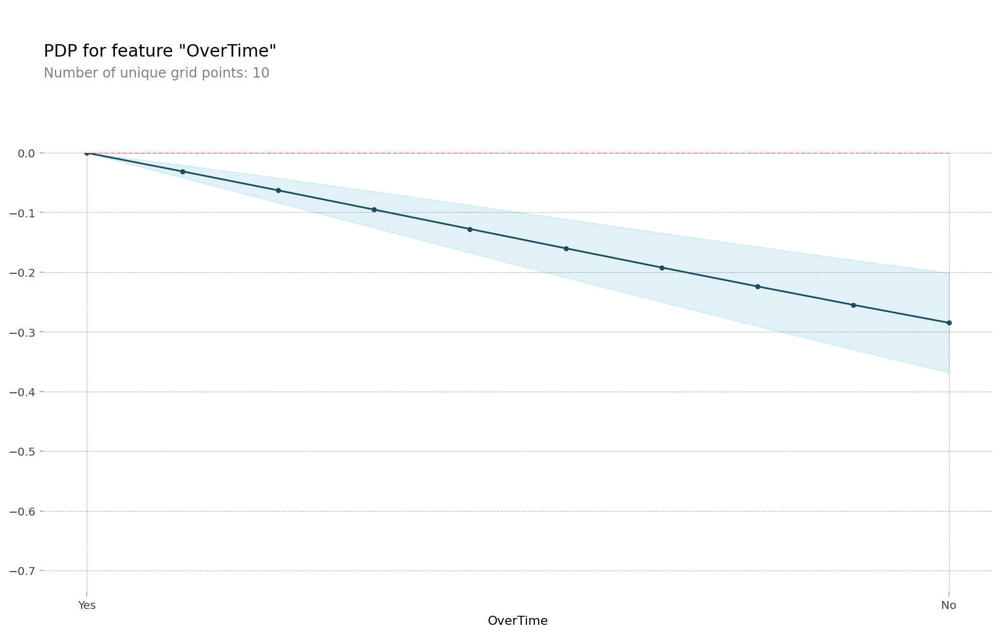

In [128]:
# 인코딩 전 이름으로 PDP plot 시각화
pdp_plot(pdp_dist, feature)

# xticks labels 설정을 위한 리스트를 직접 넣지 않아도 됨
plt.xticks(category_codes, category_names);

In [ ]:
# overtime은 초과근무 여부에 대한 항목이다.
# 초과근무가 자발적인 것인지, 얼마나 자주 초과근무를 하는지는 알 수 없지만, 모델은 초과근무를 하는 직원일 때 이직을 할 가능성이 높다고 예측한다.

(<Figure size 1080x684 with 2 Axes>,
 {'pdp_ax': <matplotlib.axes._subplots.AxesSubplot at 0x7f2b87549350>,
  'title_ax': <matplotlib.axes._subplots.AxesSubplot at 0x7f2b88fcc950>})

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


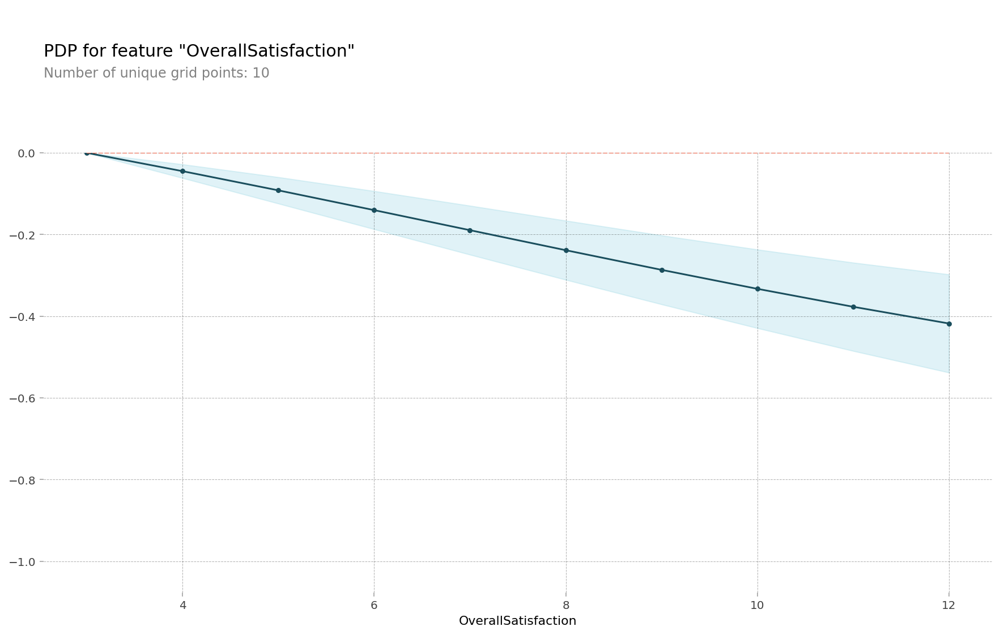

In [125]:
feature = 'OverallSatisfaction'

pdp_dist = pdp_isolate(
    model= model
    , dataset=X_test
    , model_features= X_test.columns
    , feature=feature
    , grid_type='equal'
    , num_grid_points=10)

pdp_plot(pdp_dist, feature)

In [ ]:
# OverallSatisfaction은 3~12로 나뉘어진 직원의 회사에 대한 전반적인 만족도에 관한 설문조사 항목이다.
# 만족도가 12에 가까울 수록 현재 회사에 만족하고 있다고 해석할 수 있다.
# 모델은 만족도가 증가함에 따라 직원이 이직을 할 가능성이 낮다고 예측한다.

(<Figure size 1080x684 with 2 Axes>,
 {'pdp_ax': <matplotlib.axes._subplots.AxesSubplot at 0x7f2b95510790>,
  'title_ax': <matplotlib.axes._subplots.AxesSubplot at 0x7f2b9261e9d0>})

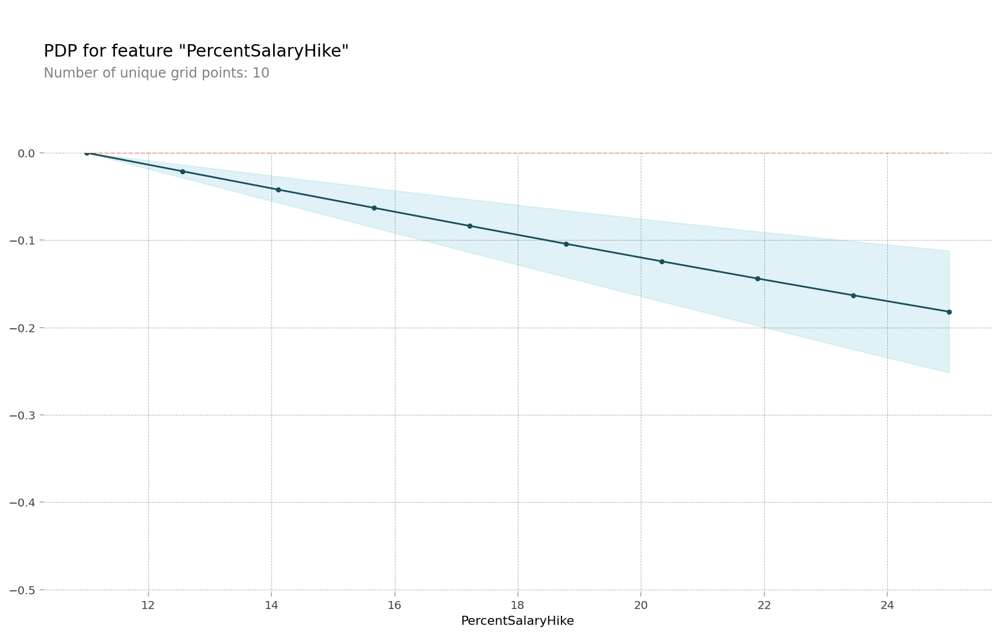

In [149]:
feature = 'PercentSalaryHike'

# PDP isolate 계산
pdp_dist = pdp_isolate(
    model= model
    , dataset=X_test
    , model_features= X_test.columns
    , feature=feature
    , grid_type='equal'
    , num_grid_points=10)

pdp_plot(pdp_dist, feature)

In [ ]:
# 임금 상승율이 높을 수록, 이직을 할 확률이 낮아짐을 확인할 수 있다.

In [135]:
from pdpbox.pdp import pdp_interact 
from pdpbox.pdp import pdp_interact_plot 

In [ ]:
# pdp_interact 를 사용하여 두 특성의 상호작용이 타겟에 미치는 영향 확인

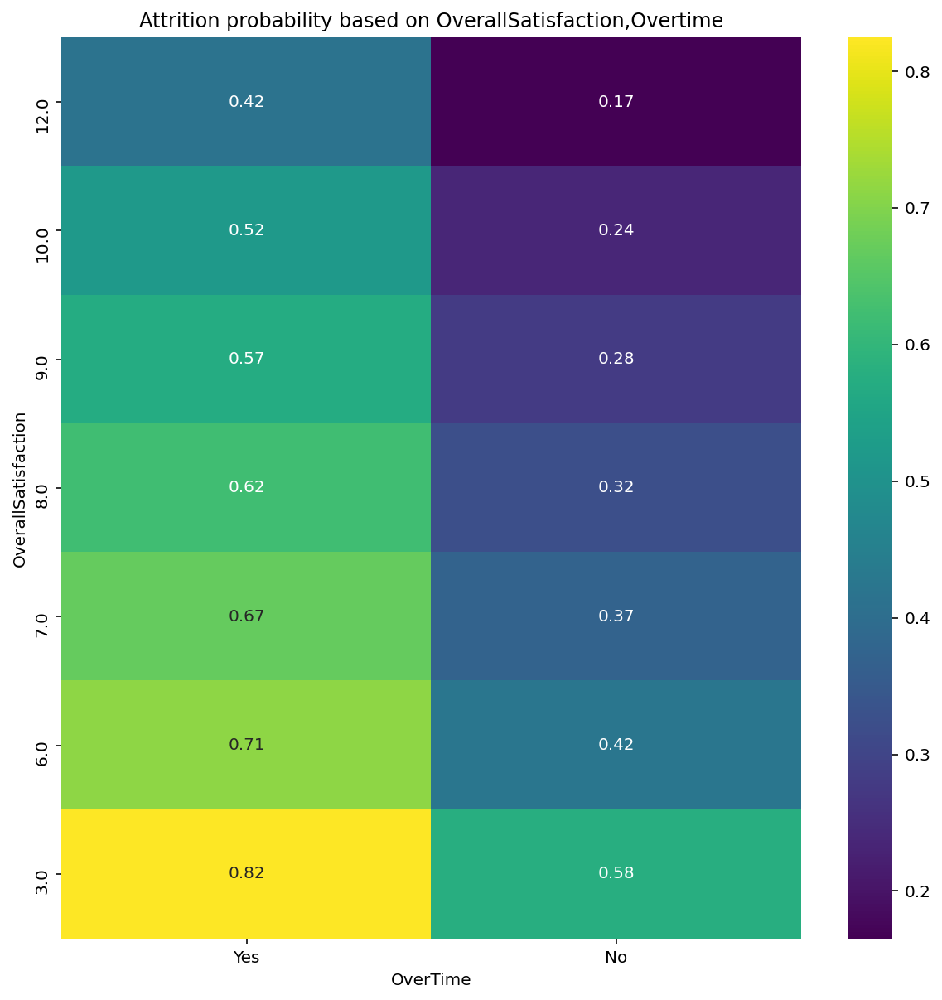

In [138]:
features = ['OverTime', 'OverallSatisfaction']

# 두 특성의 상호작용 확인하기 위한 데이터 불러오기
interaction = pdp_interact(
    model= model
    , dataset=X_test
    , model_features= X_test.columns
    , features=features   # 상호작용 확인하고자 하는 두가지 특성
)

pdp = interaction.pdp.pivot_table(
    values='preds', 
    columns=features[0], 
    index=features[1]
)[::-1]

pdp = pdp.rename(columns={1.0:'Yes',2.0:'No'})
plt.figure(figsize=(10,10))
sns.heatmap(pdp, annot=True, fmt='.2f', cmap='viridis')
plt.title('Attrition probability based on OverallSatisfaction,Overtime');

In [ ]:
# 초과근무와 전반적인 만족도에 따른 이직확률
# 초과근무를 하며 전반적 만족도가 6.5점 이하인 직원들은 이직을 할 확률이 두드러지게 높다.
# 초과근무를 하며 전반적인 만족도가 11,12로 높은 직원들이 이직을 할 확률은 초과근무를 하지 않으나 만족도가 6인 직원들 보다도 높다.
# 초과근무에 대한 대안책을 마련이 시급한 것으로 보인다. 

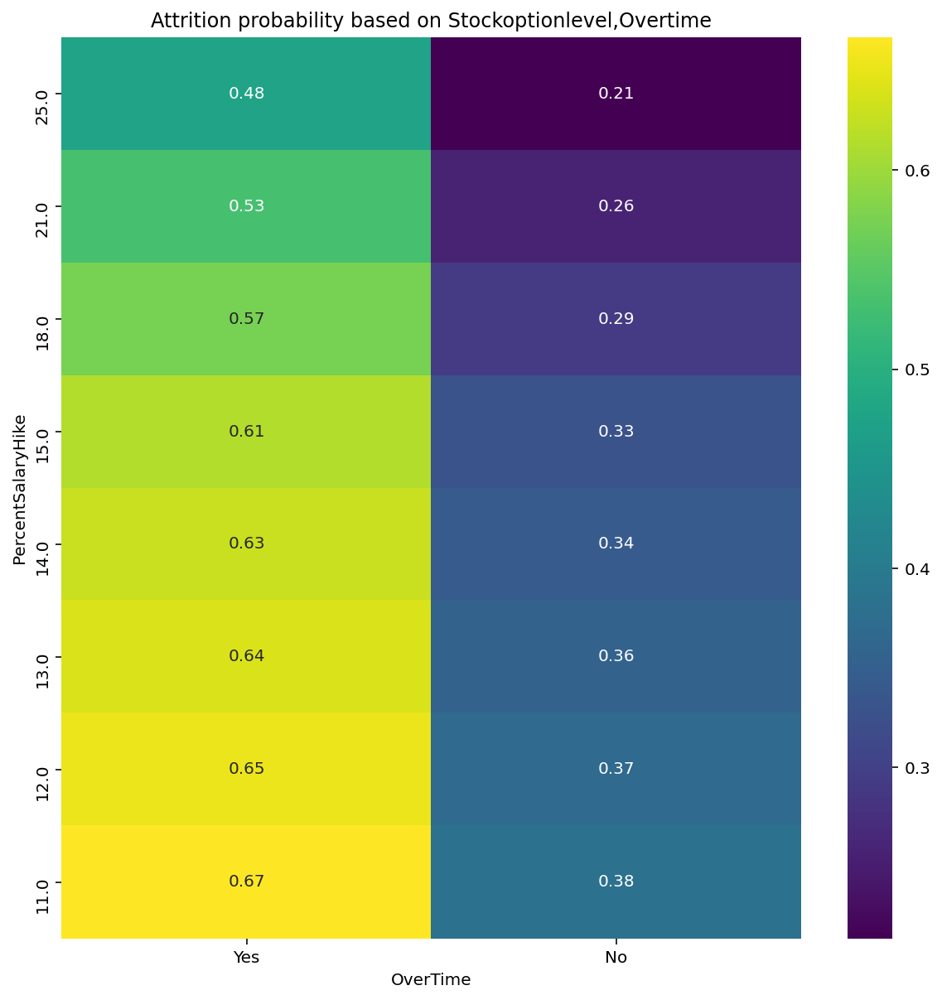

In [150]:
features = ['OverTime', 'PercentSalaryHike']

# 두 특성의 상호작용 확인하기 위한 데이터 불러오기
interaction = pdp_interact(
    model= model
    , dataset=X_test
    , model_features= X_test.columns
    , features=features   # 상호작용 확인하고자 하는 두가지 특성
)

pdp = interaction.pdp.pivot_table(
    values='preds', 
    columns=features[0], 
    index=features[1]
)[::-1]

pdp = pdp.rename(columns={1.0:'Yes',2.0:'No'})
plt.figure(figsize=(10,10))
sns.heatmap(pdp, annot=True, fmt='.2f', cmap='viridis')
plt.title('Attrition probability based on Stockoptionlevel,Overtime');

In [137]:
# 초과근무와 임금상승율에 따른 이직확률
# 초과근무를 하지 않는 직원의 이직여부는 임금상승률에 큰 영향을 크게 받지 않는 것으로 보이지만, 초과근무를 하는 직원의 경우 임금상승률이 아주 높더라도 이직할 확률이 초과근무를 하지 않는 사람보다 높은 편이다.

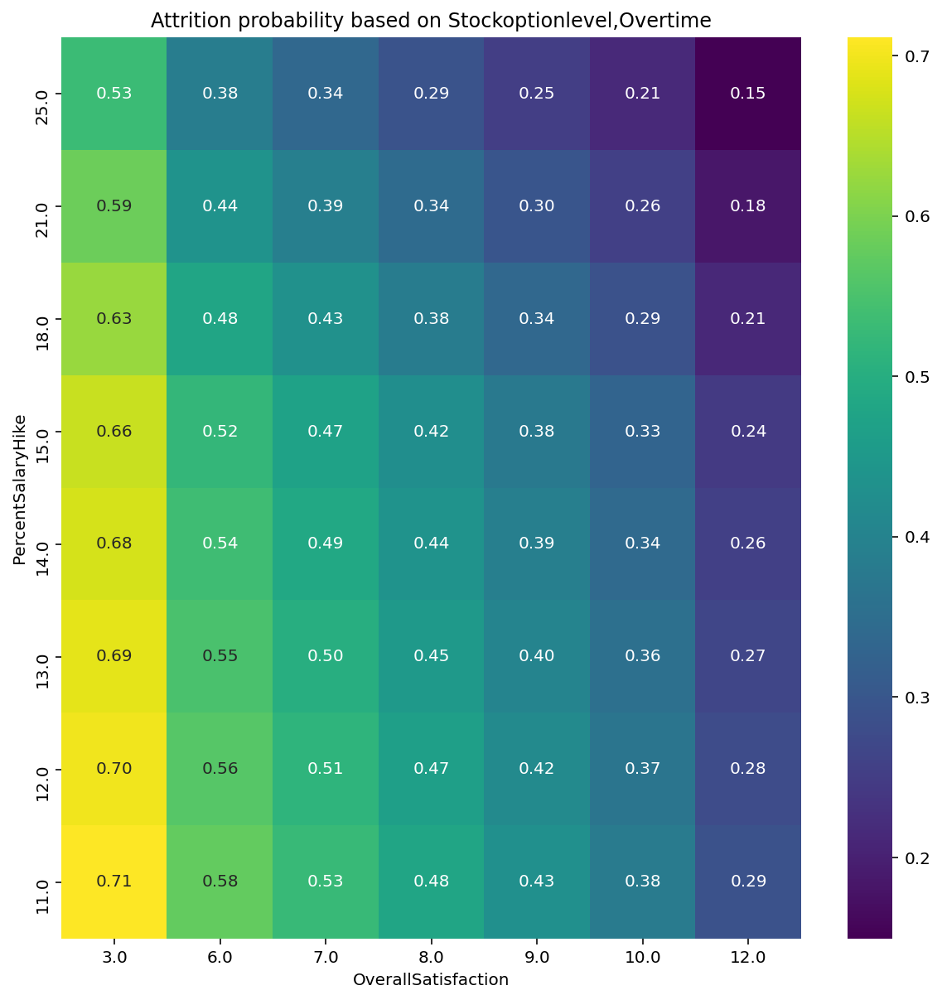

In [151]:
features = ['OverallSatisfaction', 'PercentSalaryHike']

# 두 특성의 상호작용 확인하기 위한 데이터 불러오기
interaction = pdp_interact(
    model= model
    , dataset=X_test
    , model_features= X_test.columns
    , features=features   # 상호작용 확인하고자 하는 두가지 특성
)

pdp = interaction.pdp.pivot_table(
    values='preds', 
    columns=features[0], 
    index=features[1]
)[::-1]

pdp = pdp.rename(columns={1.0:'Yes',2.0:'No'})
plt.figure(figsize=(10,10))
sns.heatmap(pdp, annot=True, fmt='.2f', cmap='viridis')
plt.title('Attrition probability based on Stockoptionlevel,Overtime');

In [ ]:
# 전반적인 만족도와 임금상승율에 따른 이직확률
# 각 만족도 수준에서 임금상승율이 높을 수록 이탈률이 비례하여 낮아지는 것을 확인할 수 있었다.

# 결론

해당 기업의 이직을 예측함에 있어서 초과근무의 여부가 가장 크게 영향을 주는 요소이며, 전반적인 만족도, 임금상승율이 그 뒤를 이었다.  
두 특성의 상호작용을 확인해 보았을 때에도, 일단 초과근무를 하는 직원이라면 이직을 할 확률이 확연하게 높아짐을 확인할 수 있었다.  
따라서 무엇보다도 초과근무로 이직을 고민하는 상황을 방지하기 위한 대안책이 시급해 보인다.